Author:
- Xianyun Zhuang
- Yutao Chen

In [ ]:
pip install memory-profiler

In [12]:
# Libraries Import
import numpy as np

import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

import time
from memory_profiler import memory_usage

import community as community_louvain
from networkx.algorithms.community import girvan_newman
from networkx.algorithms.community.quality import modularity
from sklearn.metrics import normalized_mutual_info_score


# Delivery 1 Linear algebra exercices

1) Answers to linear algebra exercices which don't require python program.

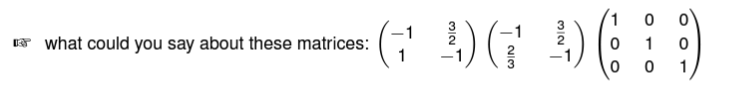

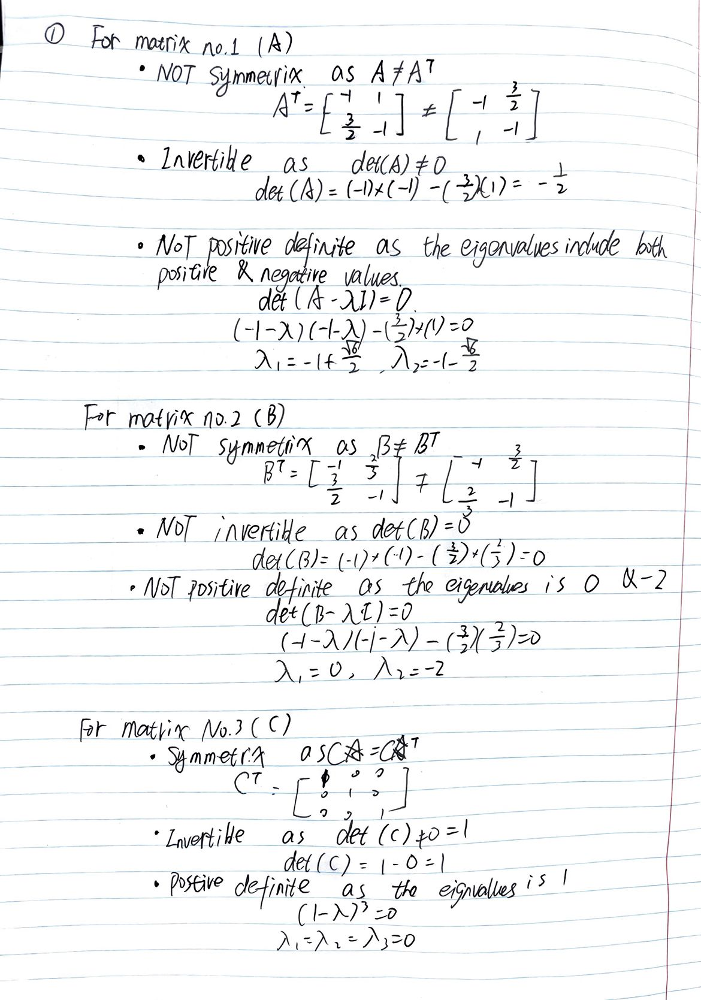

---

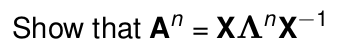

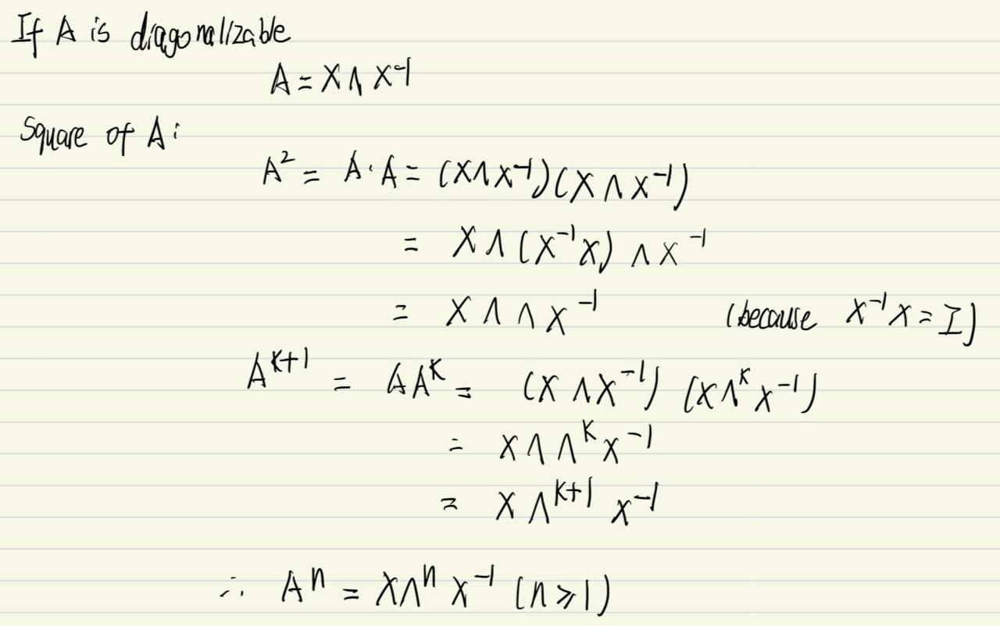

---

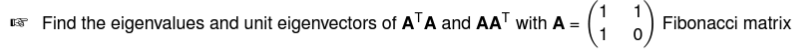

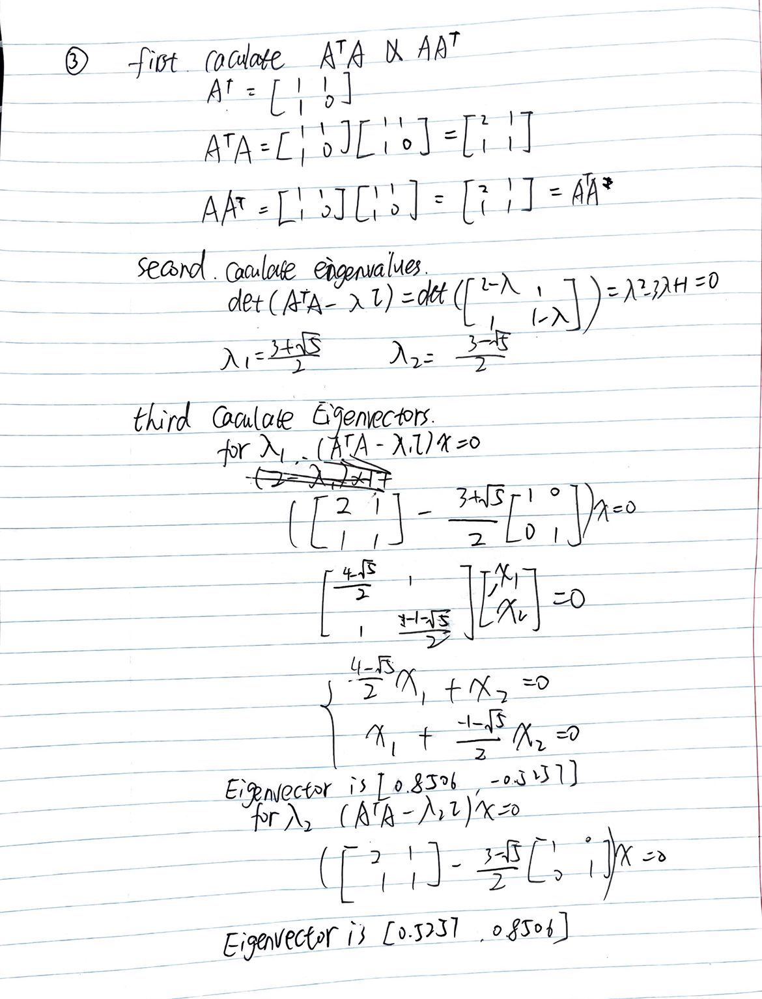

It is so complicated to calculate manually.

In [13]:
# Define matrix A
A = np.array([[1, 1], [1, 0]])

# Compute A^T * A and A * A^T
ATA = np.dot(A.T, A)
AAT = np.dot(A, A.T)

# Compute eigenvalues and eigenvectors of ATA and AAT
eigvals_ATA, eigvecs_ATA = np.linalg.eig(ATA)
eigvals_AAT, eigvecs_AAT = np.linalg.eig(AAT)

print("Eigenvalues of ATA:", eigvals_ATA)
print("Eigenvectors of ATA:", eigvecs_ATA)
print("Eigenvalues of AAT:", eigvals_AAT)
print("Eigenvectors of AAT:", eigvecs_AAT)


Eigenvalues of ATA: [2.61803399 0.38196601]
Eigenvectors of ATA: [[ 0.85065081 -0.52573111]
 [ 0.52573111  0.85065081]]
Eigenvalues of AAT: [2.61803399 0.38196601]
Eigenvectors of AAT: [[ 0.85065081 -0.52573111]
 [ 0.52573111  0.85065081]]


---

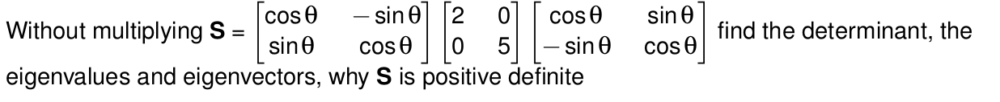

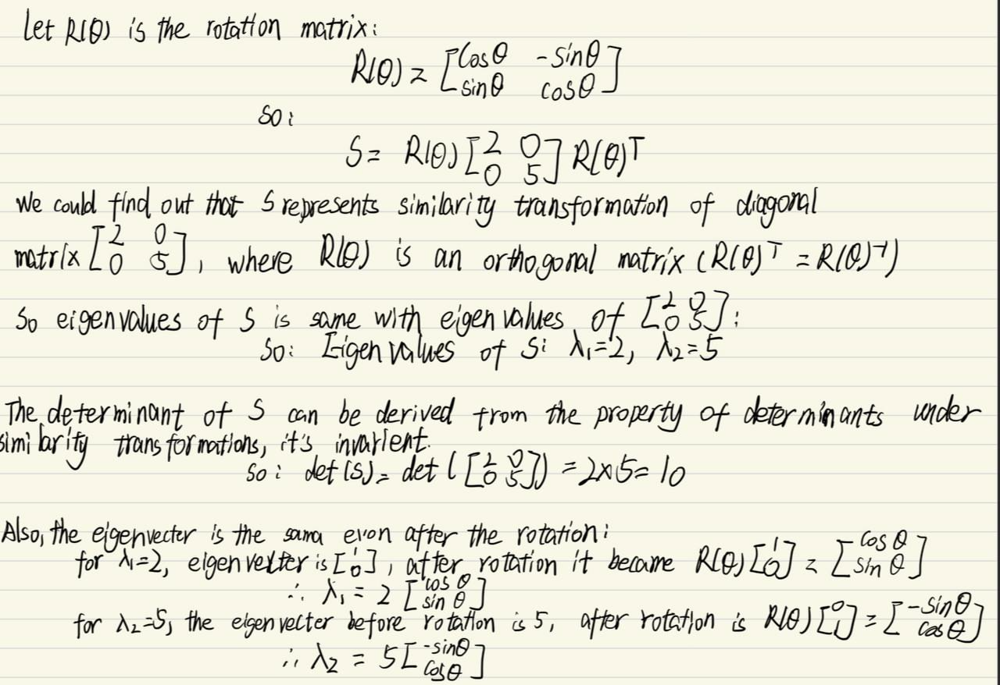

---

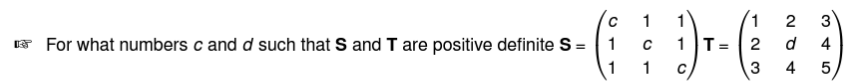

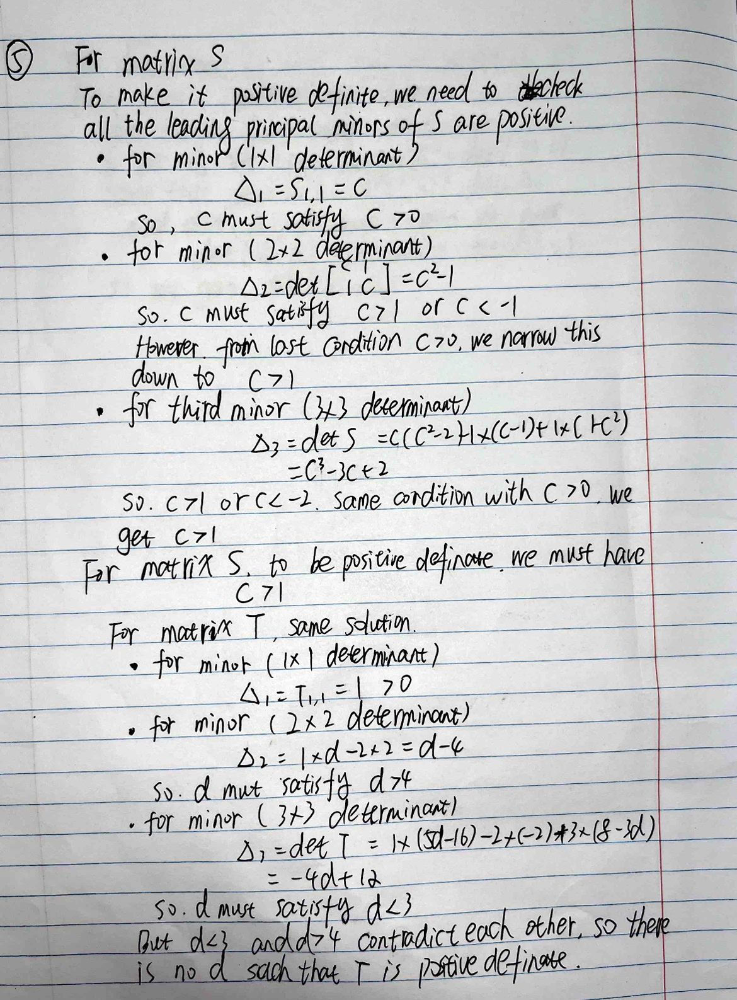

---

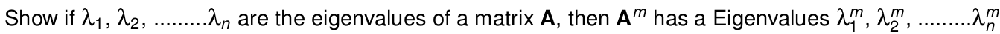

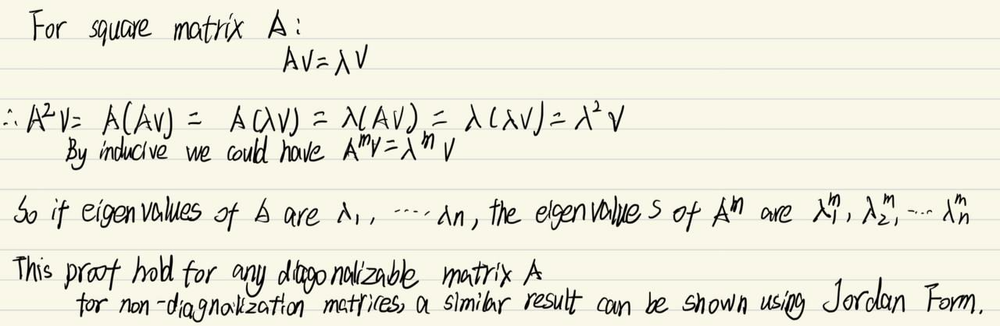

---

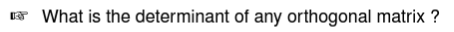

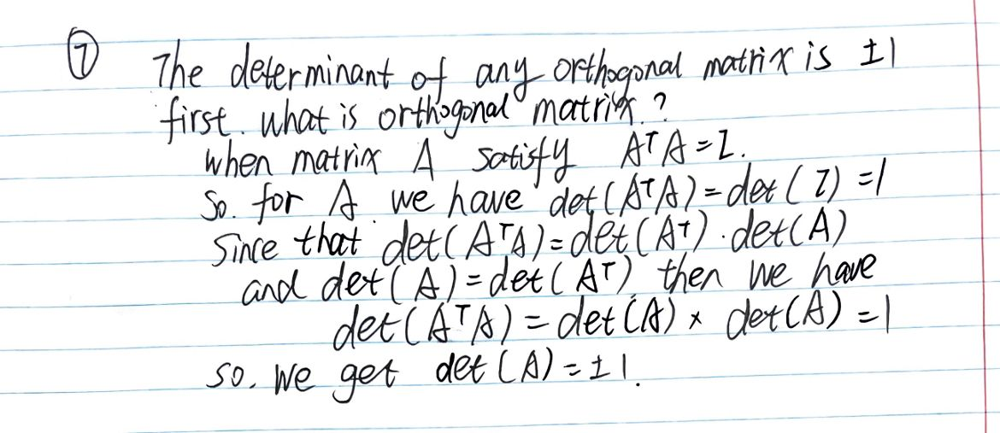

---

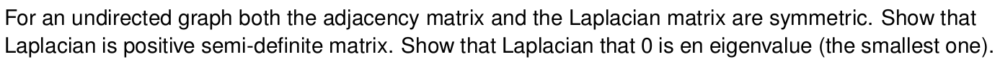

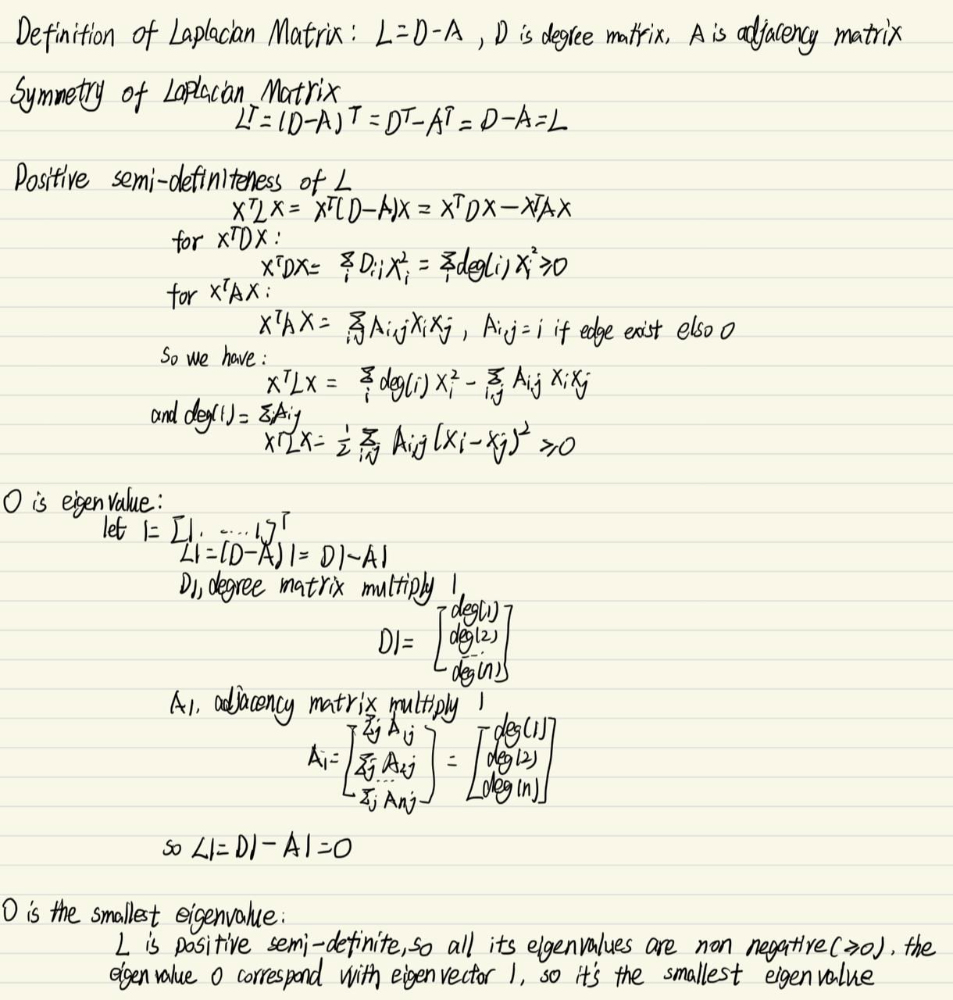

---

## Properties of a Square Matrix

In [ ]:
from scipy.linalg import fractional_matrix_power
from scipy.linalg import sqrtm, orth
import sympy as sp
import numpy as np
import math

### Vector Norms

Vector norms are mathematical measures of the "size" or magnitude of a vector. They are used to quantify how far a vector extends from the origin in space. Two commonly used vector norms are the **L1 norm** and the **L2 norm**:

- **L1 Norm (Manhattan Norm)**:  
  The L1 norm is the sum of the absolute values of the vector's elements. It measures the "city block" distance from the origin to the vector. Mathematically:  

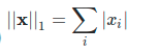


- **L2 Norm (Euclidean Norm)**:  
  The L2 norm is the square root of the sum of the squares of the vector's elements. It measures the "as-the-crow-flies" distance from the origin to the vector. Mathematically:  

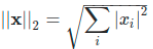

In [ ]:
v = np.array([1, 2, 3])
print("Vector:", v)

# L1 norm
l1_norm = np.linalg.norm(v, ord=1)
print("L1 norm:", l1_norm)

# L2 norm
l2_norm = np.linalg.norm(v, ord=2)
print("L2 norm:", l2_norm)

Vector: [1 2 3]
L1 norm: 6.0
L2 norm: 3.7416573867739413


---

### Matrix Norms

Matrix norms are mathematical measures of the "size" or magnitude of a matrix. A commonly used matrix norm is the **Frobenius norm**:

- **Frobenius Norm**:  
  The Frobenius norm is a measure of the "size" of a matrix. It is computed as the square root of the sum of the squares of all its elements. Mathematically:

  $$\|A\|_F = \sqrt{\sum_{i=1}^m \sum_{j=1}^n |a_{ij}|^2}$$

In [ ]:
A = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
print(f"A={A}")

nb_rows = len(A)
print(f"Number of rows of A: \n{nb_rows}")
nb_columns = len(A[0])
print(f"Number of columns of A: \n{nb_columns}")

norm_A = np.linalg.norm(A, ord='fro')
print(f"Norm of A: {norm_A}")

A=[[1 2 3]
 [4 5 6]
 [7 8 9]]
Number of rows of A: 
3
Number of columns of A: 
3
Norm of A: 16.881943016134134


---

### Matrix Transpose

The transpose of a matrix \( A \), denoted as \( A^T \), is a new matrix that results from swapping the rows and columns of \( A \). In other words, the \( i \)-th row of \( A^T \) is the \( i \)-th column of \( A \), and vice versa.

Mathematically:

$$
A^T_{ij} = A_{ji}
$$


In [ ]:
A_transpose = np.transpose(A)
print(f"Transpose of A: \n{A_transpose}")

Transpose of A: 
[[1 4 7]
 [2 5 8]
 [3 6 9]]


---

### Matrix Determinant

Definition

The **determinant** of a square matrix \( A \in \mathbb{R}^{n \times n} \) is a scalar value that provides important information about the matrix, such as whether it is invertible. The determinant is denoted as \( \det(A) \) or \( |A| \).

For a matrix \( A \), the determinant can be computed using recursive expansion (Laplace expansion) or specific formulas depending on the size of the matrix.

Properties of Determinants

1. **Invertibility**:
   A square matrix \( A \) is invertible if and only if:
   $$
   \det(A) \neq 0
   $$

2. **Multiplicative Property**:
   For two square matrices \( A \) and \( B \) of the same size:
   $$
   \det(AB) = \det(A) \cdot \det(B)
   $$

3. **Transpose**:
   The determinant of a matrix and its transpose are equal:
   $$
   \det(A^\top) = \det(A)
   $$

4. **Effect of Row Operations**:
   - Swapping two rows: Multiplies the determinant by \( -1 \).
   - Scaling a row by a scalar \( k \): Multiplies the determinant by \( k \).
   - Adding a multiple of one row to another: Does not change the determinant.

5. **Determinant of Diagonal, Triangular, or Identity Matrices**:
   - For a diagonal or triangular matrix \( A \), the determinant is the product of its diagonal entries:
     $$
     \det(A) = a_{11} \cdot a_{22} \cdot \ldots \cdot a_{nn}.
     $$
   - For the identity matrix \( I \):
     $$
     \det(I) = 1.
     $$

In [ ]:
determinant = np.linalg.det(A)
print(f"Determinant of A: \n{determinant}")

Determinant of A: 
0.0


A determinant equal to zero means that a matrix is a singular matrix. A matrix is singular if it does not have an inverse, which means it cannot be used to solve systems of linear equations.

---

### Eigenvectors and Eigenvalues

Definition

For a square matrix \( A \in \mathbb{R}^{n \times n} \), an **eigenvector** is a non-zero vector \( v \in \mathbb{R}^n \) such that, when \( A \) acts on \( v \), the result is a scalar multiple of \( v \). This relationship is expressed as:
$$
A v = \lambda v,
$$
where:
- \( \lambda \in \mathbb{R} \) (or \( \mathbb{C} \)) is the **eigenvalue** corresponding to the eigenvector \( v \).


Key Concepts

1. **Eigenvalue Equation**:
   To find the eigenvalues, we rearrange the eigenvalue equation:
   $$
   (A - \lambda I)v = 0,
   $$
   where \( I \) is the identity matrix. For non-zero \( v \), this requires:
   $$
   \det(A - \lambda I) = 0.
   $$

   The determinant equation \( \det(A - \lambda I) = 0 \) is called the **characteristic equation**, and solving it gives the eigenvalues \( \lambda \).

2. **Eigenvector**:
   Once the eigenvalues are known, substitute \( \lambda \) into \( (A - \lambda I)v = 0 \) to solve for the eigenvector \( v \).


Properties of Eigenvectors and Eigenvalues

1. **Number of Eigenvalues**:
   A square matrix \( A \in \mathbb{R}^{n \times n} \) has exactly \( n \) eigenvalues (including repeated eigenvalues) when counted with their algebraic multiplicity.

2. **Determinant and Trace**:
   - The determinant of \( A \) is the product of its eigenvalues:
     $$
     \det(A) = \prod_{i=1}^n \lambda_i.
     $$
   - The trace of \( A \) (sum of diagonal elements) is the sum of its eigenvalues:
     $$
     \text{Tr}(A) = \sum_{i=1}^n \lambda_i.
     $$

3. **Diagonalization**:
   A matrix \( A \) is diagonalizable if there exists a matrix \( P \) such that:
   $$
   A = P D P^{-1},
   $$
   where \( D \) is a diagonal matrix with eigenvalues on the diagonal, and the columns of \( P \) are the eigenvectors of \( A \).

4. **Stability (Dynamics)**:
   In systems of differential equations, the eigenvalues of the system matrix determine stability:
   - If all eigenvalues have negative real parts, the system is stable.
   - If any eigenvalue has a positive real part, the system is unstable.

In [ ]:
eigenvalues, eigenvectors = np.linalg.eig(A)

is_real_eigenvalues = np.all(np.isreal(eigenvalues))

print(f"Eigenvalues of A: \n{eigenvalues}")
print(f"Eigenvectors of A: \n{eigenvectors}")

Eigenvalues of A: 
[ 1.61168440e+01 -1.11684397e+00 -1.30367773e-15]
Eigenvectors of A: 
[[-0.23197069 -0.78583024  0.40824829]
 [-0.52532209 -0.08675134 -0.81649658]
 [-0.8186735   0.61232756  0.40824829]]


---

### Eigen Decomposition

Eigendecomposition is a fundamental concept in linear algebra, where a matrix is decomposed into its eigenvalues and eigenvectors. For a square matrix \( A \), the eigendecomposition is represented as:

$$
A = P \cdot D \cdot P^{-1}
$$

where:

- \( P \) is a matrix whose columns are the eigenvectors of \( A \).
- \( D \) is a diagonal matrix whose diagonal elements are the eigenvalues of \( A \).
- \( P^{-1} \) is the inverse of the matrix \( P \).

In practice, eigendecomposition can only be applied to diagonalizable matrices (those with a full set of linearly independent eigenvectors). The matrix must also be symmetric if real eigenvalues and real eigenvectors are desired.

In [ ]:
eigenvalues, eigenvectors = np.linalg.eig(A)
A_reconstructed = np.dot(np.dot(eigenvectors, np.diag(eigenvalues)), np.linalg.inv(eigenvectors))
is_eigendecomposition = np.allclose(A, A_reconstructed)

if is_eigendecomposition:
    print("Eigendecomposition is successful.")
else:
    print("Eigendecomposition is not successful.")

Eigendecomposition is successful.


---

### Invertible Matrix

Definition

An **invertible matrix** (also known as a **non-singular matrix**) is a square matrix \( A \in \mathbb{R}^{n \times n} \) that has an **inverse** \( A^{-1} \), such that:
$$
A A^{-1} = A^{-1} A = I,
$$
where \( I \) is the \( n \times n \) identity matrix.

For a matrix to be invertible, it must satisfy the following conditions:
1. \( A \) must be a square matrix.
2. The determinant of \( A \) is non-zero:
   $$
   \det(A) \neq 0
   $$


Key Properties of Invertible Matrices

1. **Unique Inverse**:
   If \( A \) is invertible, its inverse \( A^{-1} \) is unique.

2. **Determinant**:
   A matrix \( A \) is invertible if and only if \( \det(A) \neq 0 \).

3. **Row Equivalence**:
   A square matrix \( A \) is invertible if it can be row reduced to the identity matrix \( I \) using elementary row operations.

4. **Product Rule**:
   The product of two invertible matrices is also invertible. For matrices \( A \) and \( B \):
   $$
   (AB)^{-1} = B^{-1} A^{-1}
   $$

5. **Transpose**:
   The transpose of an invertible matrix is also invertible. If \( A \) is invertible:
   $$
   (A^\top)^{-1} = (A^{-1})^\top
   $$

6. **Inverse of a Diagonal Matrix**:
   A diagonal matrix \( D \) is invertible if all its diagonal entries are non-zero. The inverse is given by:
   $$
   D^{-1} = \begin{bmatrix}
   \frac{1}{d_1} & 0 & \cdots & 0 \\
   0 & \frac{1}{d_2} & \cdots & 0 \\
   \vdots & \vdots & \ddots & \vdots \\
   0 & 0 & \cdots & \frac{1}{d_n}
   \end{bmatrix}
   $$

In [ ]:
def is_invertible(matrix):
  invertible = np.linalg.matrix_rank(matrix) == matrix.shape[0]
  return invertible

print("Is this matrix invertible?", is_invertible(A))

Is this matrix invertible? False


---

### Orthogonal Matrix

Definition

An **orthogonal matrix** \( Q \) is a square matrix where the rows and columns are orthonormal vectors. This means that:

1. The rows (or columns) are **orthogonal** to each other:
   $$
   \text{If } i \neq j, \quad q_i^\top q_j = 0
   $$

2. Each row (or column) has a unit norm:
   $$
   \| q_i \| = 1
   $$

Mathematically, a matrix \( Q \in \mathbb{R}^{n \times n} \) is orthogonal if:
$$
Q^\top Q = QQ^\top = I
$$
where \( I \) is the identity matrix of size \( n \).


Key Properties of Orthogonal Matrices

1. **Preservation of Lengths (Norms)**:
   For any vector \( x \in \mathbb{R}^n \), an orthogonal matrix preserves the length:
   $$
   \| Qx \| = \| x \|
   $$

2. **Inverse is the Transpose**:
   The inverse of an orthogonal matrix is equal to its transpose:
   $$
   Q^{-1} = Q^\top
   $$

3. **Determinant**:
   The determinant of an orthogonal matrix is either \( +1 \) or \( -1 \):
   $$
   \det(Q) = \pm 1
   $$

4. **Eigenvalues**:
   The eigenvalues of an orthogonal matrix have an absolute value of 1. For real orthogonal matrices, eigenvalues can only be \( \pm 1 \).

5. **Orthogonal Transformations**:
   Orthogonal matrices represent rotations or reflections in \( n \)-dimensional space.

In [ ]:
def is_orthogonal(matrix):
  orthogonal = np.allclose(np.dot(matrix, matrix.T), np.identity(matrix.shape[0]))
  return orthogonal

print("Is matrix A orthogonal?",is_orthogonal(A))

Is matrix A orthogonal? False


---

### Positive (Semi-)Definite Matrices

Definitions:

1. **Positive Definite Matrix**:
   A symmetric matrix \( A \in \mathbb{R}^{n \times n} \) is called positive definite if, for any non-zero vector \( x \in \mathbb{R}^n \), the following condition holds:
   $$
   x^\top A x > 0
   $$

2. **Positive Semi-Definite Matrix**:
   A symmetric matrix \( A \in \mathbb{R}^{n \times n} \) is called positive semi-definite if, for any vector \( x \in \mathbb{R}^n \), the following condition holds:
   $$
   x^\top A x \geq 0
   $$


Key Properties of Positive (Semi-)Definite Matrices

1. **Symmetry**:
   Positive (semi-)definite matrices are always symmetric:
   $$
   A = A^\top
   $$

2. **Eigenvalues**:
   - A matrix is **positive definite** if and only if all its eigenvalues are strictly positive (\( \lambda_i > 0 \)).
   - A matrix is **positive semi-definite** if and only if all its eigenvalues are non-negative (\( \lambda_i \geq 0 \)).

3. **Cholesky Decomposition**:
   - A matrix is positive definite if and only if it can be decomposed as:
     $$
     A = LL^\top
     $$
     where \( L \) is a lower triangular matrix with positive diagonal entries.

4. **Quadratic Form**:
   For a positive (semi-)definite matrix \( A \), the quadratic form \( x^\top A x \):
   - Is strictly positive for positive definite matrices.
   - Is non-negative for positive semi-definite matrices.

5. **Relation to Positive Definite Functions**:
   Positive definite matrices are closely related to covariance matrices in probability and statistics, as these must be positive semi-definite to ensure valid variance and covariance properties.

In [ ]:
def is_positive_definite(matrix):
    if not np.allclose(matrix, matrix.T):
        return False

    eigenvalues = np.linalg.eigvals(matrix)
    if np.any(eigenvalues <= 0):
        return False

    return True

C = np.array([[2, -1],
              [-1, 2]])

if is_positive_definite(C):
    print("The matrix is positive definite.")
else:
    print("The matrix is not positive definite.")

The matrix is positive definite.


---

### Laplacian Matrix

The Laplacian matrix is a specific type of square matrix widely used in graph theory to analyze the properties of a graph. For an undirected graph, the Laplacian matrix is computed by subtracting the adjacency matrix of the graph from its degree matrix. The Laplacian matrix has the following important properties:

- It is symmetric, i.e., \( L = L^T \).
- Its eigenvalues are all real numbers.
- The determinant of the Laplacian matrix is non-negative, \( \text{det}(L) \geq 0 \).
- For each row or column, the sum of all elements (except for the diagonal) is zero.

In mathematical terms, the Laplacian matrix \( L \) is defined as:

\[
L = D - A
\]

where:
- \( D \) is the degree matrix (a diagonal matrix with vertex degrees on the diagonal),
- \( A \) is the adjacency matrix of the graph.

In [ ]:
def compute_laplacian_matrix(adjacency_matrix):
    degree_matrix = np.diag(np.sum(adjacency_matrix, axis=1))
    laplacian_matrix = degree_matrix - adjacency_matrix

    return laplacian_matrix

adjacency_matrix = np.array([
    [0, 1, 1, 0],
    [1, 0, 1, 1],
    [1, 1, 0, 1],
    [0, 1, 1, 0]
])

laplacian_matrix = compute_laplacian_matrix(adjacency_matrix)

print("Adjacency Matrix:")
print(adjacency_matrix)

print("\nLaplacian Matrix:")
print(laplacian_matrix)

Adjacency Matrix:
[[0 1 1 0]
 [1 0 1 1]
 [1 1 0 1]
 [0 1 1 0]]

Laplacian Matrix:
[[ 2 -1 -1  0]
 [-1  3 -1 -1]
 [-1 -1  3 -1]
 [ 0 -1 -1  2]]


---

# Delivery 2


2) Comparison between basic random walk and lazy random walk (with formalisation) and/or page rank and Hits algorithms (with formalisation) and/or one or more  example  of specific graphs where the expected  hitting probability/time could shown easily.

## Comparison basic Random Walk and Lazy Random walk

### Basic Random Walk

Basic Random Walk: Formalisation

Definition
Given an undirected graph \( G = (V, E) \):
- A random walk is a process that starts at some vertex \( u \in V \) and at each step, moves to a random neighbor of the current vertex.
- Let \( p_t(u) \) denote the probability of being at vertex \( u \) at time \( t \). The vector \( p_t \in \mathbb{R}^n \) satisfies:

$$
\sum_{u \in V} p_t(u) = 1
$$

This ensures \( p_t \) is a valid probability distribution.

Transition Rule

At time \( t+1 \), the probability of being at vertex \( v \) is:

$$
p_{t+1}(v) = \sum_{(u, v) \in E(G)} p_t(u) \cdot \frac{1}{d(u)},
$$

where \( d(u) \) is the degree of vertex \( u \), and \( \frac{1}{d(u)} \) is the probability of transitioning from \( u \) to one of its neighbors.


**Matrix Form**
We can represent the random walk using matrix notation:

1. **Transition Matrix \( W \):**
   \[
   [W]_{i, j} =
   \begin{cases}
   \frac{1}{d(j)}, & \text{if } (i, j) \in E(G), \\
   0, & \text{otherwise}.
   \end{cases}
   \]
   Here, \( [W]_{i, j} \) represents the probability of transitioning from vertex \( j \) to vertex \( i \).

2. **Matrix Representation:**
   \[
   W_G = A \cdot D^{-1},
   \]
   where:
   - \( A \): Adjacency matrix of \( G \), with \( A_{ij} = 1 \) if there is an edge between \( i \) and \( j \), otherwise \( A_{ij} = 0 \).
   - \( D \): Diagonal matrix of vertex degrees, where \( D_{ii} = d(i) \).

3. **Random Walk Evolution:**
   The probability distribution at time \( t+1 \) is given by:
   \[
   p_{t+1} = W \cdot p_t.
   \]

Properties

1. **Probability Conservation:**
   The total probability is always conserved:
   $$
   \sum_{u \in V} p_t(u) = 1 \quad \forall t.
   $$

2. **Stationary Distribution:**
   If the graph is connected and non-bipartite, the random walk converges to a unique stationary distribution:
   $$
   \pi(u) = \frac{d(u)}{\sum_{v \in V} d(v)}.
   $$

3. **Reversibility:**
   The random walk satisfies the detailed balance condition:
   $$
   \pi(u) \cdot W_{u, v} = \pi(v) \cdot W_{v, u}.
   $$

**Conclusion**
The basic random walk is a fundamental stochastic process on graphs, governed by the adjacency and degree structure of the graph. Its matrix representation simplifies analysis, making it a key tool in understanding network dynamics and stationary distributions.

---

### Lazy Random walk

Lazy Random Walks: Formalisation

Definition

Lazy random walks are a modified version of standard random walks to address the problem of periodicity. At each time step \( t \), the lazy random walk behaves as follows:
- With probability \( \frac{1}{2} \), the walker stays at the current vertex.
- With probability \( \frac{1}{2} \), the walker takes a step to one of the neighboring vertices, following the standard random walk transition rules.

Transition Matrix

The transition probabilities for lazy random walks are represented by the matrix:
$$
W' = \frac{1}{2}(W + I) = \frac{1}{2}(I + A \cdot D^{-1}),
$$
where:
- \( W \): Transition matrix of the standard random walk.
- \( I \): Identity matrix (representing the probability of staying at the current vertex).
- \( A \): Adjacency matrix of the graph \( G \).
- \( D \): Diagonal degree matrix, where \( D_{ii} = d(i) \) is the degree of vertex \( i \).

This modification ensures that lazy random walks break the periodicity of the standard random walk.

Normalized Walk Matrix

Since \( W \) and \( W' \) are not symmetric, their analysis can be complicated. To simplify this, we define the **normalized walk matrix** as:
$$
N = D^{-1/2} \cdot W \cdot D^{-1/2} = D^{-1/2} \cdot A \cdot D^{-1/2}.
$$

The **normalized lazy walk matrix** is similarly defined as:
$$
N' = D^{-1/2} \cdot W' \cdot D^{-1/2} = \frac{1}{2} \left(I + D^{-1/2} \cdot A \cdot D^{-1/2} \right).
$$


Key Properties

1. **Eigenvalues and Eigenvectors**:
   - The matrices N and W share the same eigenvalues and related eigenvectors.
   - **Proof**:
     - Suppose v is an eigenvector of N with eigenvalue λ.
     - Define q = D^(1/2) * v.
     - Then:
       N * v = λ * v
       => (D^(-1/2) * W * D^(-1/2)) * v = λ * v.
     - Multiplying by D^(1/2) on the left-hand side:
       W * q = λ * q.
     - Thus, q is an eigenvector of W with eigenvalue λ.

2. **Stationary Distribution**:
   - By Claim 3:
     - W has eigenvector D * 1 (the vector of degrees), corresponding to eigenvalue 1.
     - The normalized walk matrix N has eigenvector D^(1/2) * 1, also with eigenvalue 1.



 **Conclusion**
Lazy random walks introduce a probability of staying at the current vertex, which effectively breaks periodicity in the graph. The normalized matrices \( N \) and \( N' \) simplify the analysis and provide useful properties such as shared eigenvalues and eigenvectors with the original matrices \( W \) and \( W' \).

This formalisation captures the mathematical essence of lazy random walks and their modifications compared to standard random walks.

---

## Examples of convergence, hitting probabilities and hitting times expectations

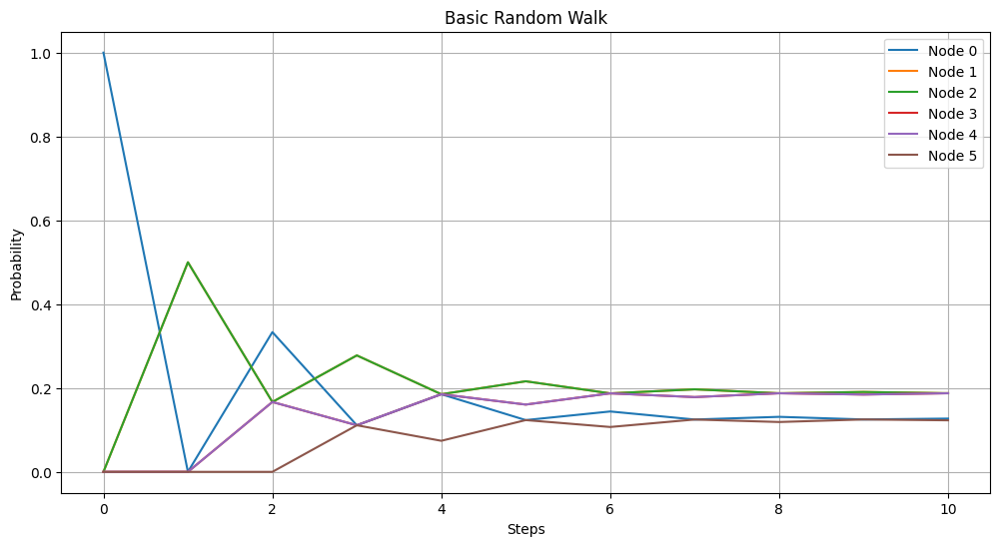

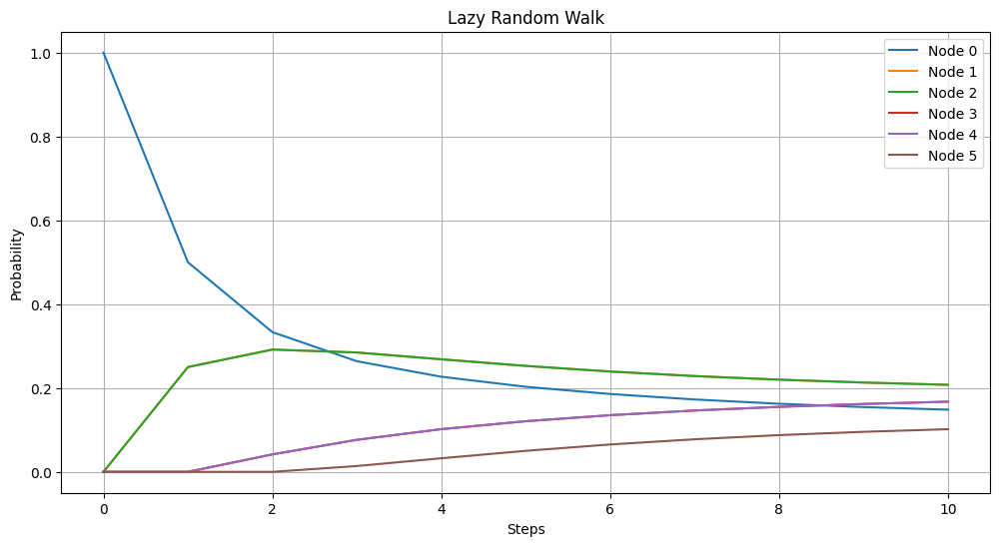

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

def create_graph():
    G = nx.Graph()
    edges = [
        (0, 1), (0, 2), (1, 2), (1, 3), (2, 4), (3, 4),
        (3, 5), (4, 5)
    ]
    G.add_edges_from(edges)
    return G

def basic_random_walk_matrix(G):
    A = nx.adjacency_matrix(G).toarray()
    degrees = np.sum(A, axis=1)
    D_inv = np.diag(1 / degrees)
    W = np.dot(D_inv, A)
    return W

def lazy_random_walk_matrix(G):
    W = basic_random_walk_matrix(G)
    I = np.eye(len(W))
    W_lazy = 0.5 * (W + I)
    return W_lazy

def simulate_random_walk(W, steps, start_node):
    n = W.shape[0]
    prob_dist = np.zeros(n)
    prob_dist[start_node] = 1
    prob_evolution = [prob_dist]

    for _ in range(steps):
        prob_dist = np.dot(prob_dist, W)
        prob_evolution.append(prob_dist)

    return np.array(prob_evolution)

def compare_random_walks(G, steps, start_node):
    W_basic = basic_random_walk_matrix(G)
    W_lazy = lazy_random_walk_matrix(G)
    basic_walk = simulate_random_walk(W_basic, steps, start_node)
    lazy_walk = simulate_random_walk(W_lazy, steps, start_node)

    return basic_walk, lazy_walk

def plot_comparison_separate(basic_walk, lazy_walk, steps):
    x = np.arange(steps + 1)

    plt.figure(figsize=(12, 6))
    for node in range(basic_walk.shape[1]):
        plt.plot(x, basic_walk[:, node], label=f"Node {node}")
    plt.xlabel("Steps")
    plt.ylabel("Probability")
    plt.title("Basic Random Walk")
    plt.legend()
    plt.grid()
    plt.show()

    plt.figure(figsize=(12, 6))
    for node in range(lazy_walk.shape[1]):
        plt.plot(x, lazy_walk[:, node], label=f"Node {node}")
    plt.xlabel("Steps")
    plt.ylabel("Probability")
    plt.title("Lazy Random Walk")
    plt.legend()
    plt.grid()
    plt.show()

def main():
    G = create_graph()
    steps = 10
    start_node = 0

    basic_walk, lazy_walk = compare_random_walks(G, steps, start_node)
    plot_comparison_separate(basic_walk, lazy_walk, steps)

if __name__ == "__main__":
    main()

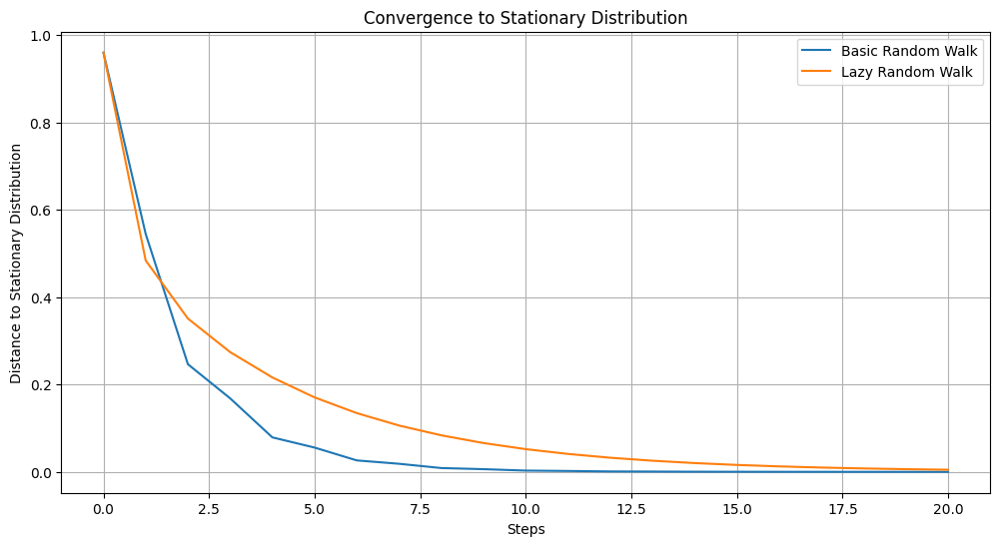

In [ ]:
def compute_stationary_distribution(W):
    eigvals, eigvecs = np.linalg.eig(W.T)
    stationary = eigvecs[:, np.isclose(eigvals, 1)]
    stationary = stationary[:, 0]
    stationary = stationary / stationary.sum()
    return np.real(stationary)

def plot_convergence(G, steps, start_node):
    W_basic = basic_random_walk_matrix(G)
    W_lazy = lazy_random_walk_matrix(G)

    stationary_basic = compute_stationary_distribution(W_basic)
    stationary_lazy = compute_stationary_distribution(W_lazy)

    basic_walk = simulate_random_walk(W_basic, steps, start_node)
    lazy_walk = simulate_random_walk(W_lazy, steps, start_node)

    basic_distances = np.linalg.norm(basic_walk - stationary_basic, axis=1)
    lazy_distances = np.linalg.norm(lazy_walk - stationary_lazy, axis=1)

    plt.figure(figsize=(12, 6))
    plt.plot(range(steps + 1), basic_distances, label="Basic Random Walk")
    plt.plot(range(steps + 1), lazy_distances, label="Lazy Random Walk")
    plt.xlabel("Steps")
    plt.ylabel("Distance to Stationary Distribution")
    plt.title("Convergence to Stationary Distribution")
    plt.legend()
    plt.grid()
    plt.show()

def main():
    G = create_graph()
    steps = 20
    start_node = 0

    plot_convergence(G, steps, start_node)

if __name__ == "__main__":
    main()

Analysis of the Chart:

    Initial State (Step 0):
        At the beginning, Node 0 has a probability of 1.0, while all other nodes have a probability of 0. This indicates that the random walk starts at Node 0.

    Evolution Over Steps:
        As the number of steps increases (from Step 1 to Step 10), the probability at Node 0 decreases steadily.
        Other nodes, particularly Nodes 2 and 4, show increasing probabilities as the random walk spreads through the network.
        The distribution gradually balances out over time.

    Steady-State Distribution:
        Around Step 10, the probabilities appear to approach a stable distribution.
        Node 2 has the highest steady-state probability, suggesting it is a central or well-connected node in the network.
        Nodes 4 and 5 also have relatively high probabilities but lower than Node 2.
        Node 0 still retains a notable probability, but it is much lower compared to Node 2.
        Nodes 1 and 3 exhibit the lowest steady-state probabilities, implying weaker connectivity or influence within the network.

Key Observations:

    Diffusion of Probability:
        The probabilities initially concentrated at Node 0 spread to other nodes over time, reflecting the diffusion process of the lazy random walk.

    Impact of Network Structure:
        Node 2's high probability suggests it may have stronger connections or a more central position in the network.
        Nodes 1 and 3's low probabilities indicate they are likely peripheral or less connected nodes.

    Characteristics of a Lazy Random Walk:
        The slower convergence of probabilities is characteristic of a lazy random walk, where there is a non-zero probability of staying at the current node, delaying the redistribution of probabilities.

Reference:
[MIT OpenCourseWare: Topics in Theoretical Computer Science - An Algorithmist's Toolkit, Lecture 4 (Fall 2009)](https://ocw.mit.edu/courses/18-409-topics-in-theoretical-computer-science-an-algorithmists-toolkit-fall-2009/100377025e8520aab9f61d8585e71cc5_MIT18_409F09_scribe4.pdf)

---

# Delivery 3

Centrality measures will help us find out the most influential nodes of a network or graph. In this Python notebook we'll take four basic centrality metrics: Degree Centrality, Clustering Coefficient Centrality, Closeness Centrality and Betweenness Centrality. We will understand the concepts behind these metrics, then implement them on small and medium-sized example graphs, and visualize the results to learn about the importance of nodes in such networks.


3) Study and analyse different centrality measures to show the comparison and their relevance according to the experimented graphs.

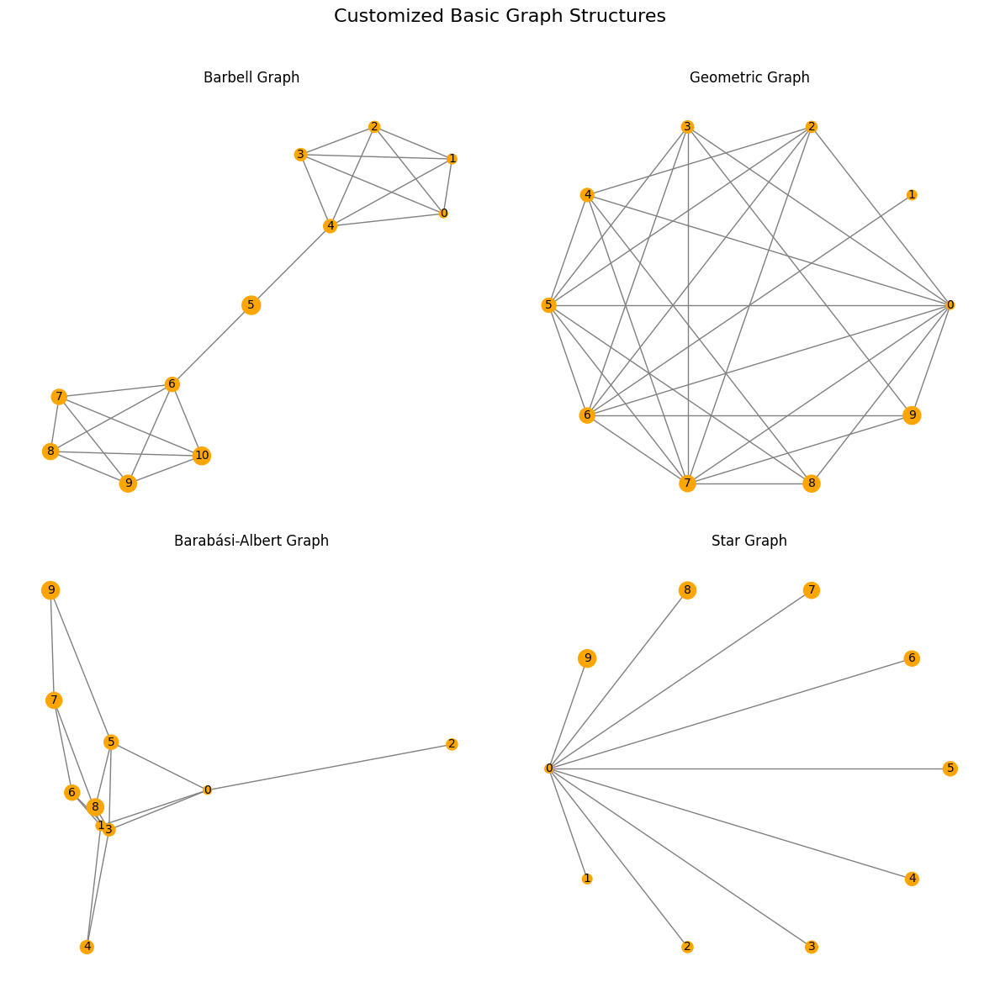

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

G1 = nx.barbell_graph(5, 1)  # Barbell Graph
G2 = nx.random_geometric_graph(10, 0.5)  # Geometric Graph
G3 = nx.barabasi_albert_graph(10, 2)  # Barabási-Albert Graph
G4 = nx.star_graph(9)  # Star Graph

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
plt.subplots_adjust(wspace=0.4, hspace=0.4)

graph_list = [G1, G2, G3, G4]
titles = ["Barbell Graph", "Geometric Graph", "Barabási-Albert Graph", "Star Graph"]
layouts = [nx.kamada_kawai_layout, nx.circular_layout, nx.spectral_layout, nx.shell_layout]

for i, (G, layout, title) in enumerate(zip(graph_list, layouts, titles)):
    pos = layout(G)
    node_sizes = [50 + i * 20 for i in range(len(G))]
    nx.draw(G, pos, node_size=node_sizes, node_color="orange", edge_color="gray", with_labels=True, font_size=10, ax=axes[i // 2, i % 2])
    axes[i // 2, i % 2].set_title(title)

plt.suptitle("Customized Basic Graph Structures", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

---

## Degree Centrality

In a network, **degree centrality** is a measure of a node's importance based on its connections. It quantifies how well a node is connected to its neighbors. The more connections a node has, the higher its potential communication activity and influence in the network.

More neighbors (connections) a node has high potential communication activity, more important it is!

Formula

The **degree centrality** of a node \( v \), denoted as \( c_v \), can be calculated as:

$$
c_v = \frac{\sum_{u \in \mathcal{N}_v} d_u}{d_v}
$$

Where:
- \( \mathcal{N}_v \): The set of neighbors of the node \( v \).
- \( d_u \): The degree (number of connections) of the neighbor \( u \).
- \( d_v \): The degree of the node \( v \) itself.

This formula computes the **average degree of the neighbors** of a node \( v \), normalized by its own degree. A node is considered important if its neighbors are also highly connected.


Matrix Representation

For larger networks, degree centrality can be expressed using matrix operations. Let:
- \( \mathbf{A} \) be the **adjacency matrix** of the network.
- \( \mathbf{D} \) be the **degree matrix**, a diagonal matrix where \( D_{ii} = d_i \), the degree of node \( i \).

The degree centrality vector \( \mathbf{c} \) can be computed as:

$$
\mathbf{c} = \mathbf{D}^{-1} \mathbf{A} \mathbf{1}
$$

Where:
- \( \mathbf{D}^{-1} \): The inverse of the degree matrix \( \mathbf{D} \).
- \( \mathbf{A} \): The adjacency matrix.
- \( \mathbf{1} \): A column vector of ones.

This matrix formula calculates the degree centrality for all nodes simultaneously by leveraging linear algebra.


Degree Centrality Results:

Barbell Graph - Degree Centrality:
  Node 0: 0.4
  Node 1: 0.4
  Node 2: 0.4
  Node 3: 0.4
  Node 4: 0.5
  Node 6: 0.5
  Node 7: 0.4
  Node 8: 0.4
  Node 9: 0.4
  Node 10: 0.4
  Node 5: 0.2


Geometric Graph - Degree Centrality:
  Node 0: 0.8888888888888888
  Node 1: 0.1111111111111111
  Node 2: 0.5555555555555556
  Node 3: 0.5555555555555556
  Node 4: 0.5555555555555556
  Node 5: 0.7777777777777777
  Node 6: 0.7777777777777777
  Node 7: 0.8888888888888888
  Node 8: 0.4444444444444444
  Node 9: 0.4444444444444444


Barabási-Albert Graph - Degree Centrality:
  Node 0: 0.4444444444444444
  Node 1: 0.5555555555555556
  Node 2: 0.1111111111111111
  Node 3: 0.6666666666666666
  Node 4: 0.2222222222222222
  Node 5: 0.4444444444444444
  Node 6: 0.3333333333333333
  Node 7: 0.3333333333333333
  Node 8: 0.2222222222222222
  Node 9: 0.2222222222222222


Star Graph - Degree Centrality:
  Node 0: 1.0
  Node 1: 0.1111111111111111
  Node 2: 0.1111111111111111
  Node 3: 0.

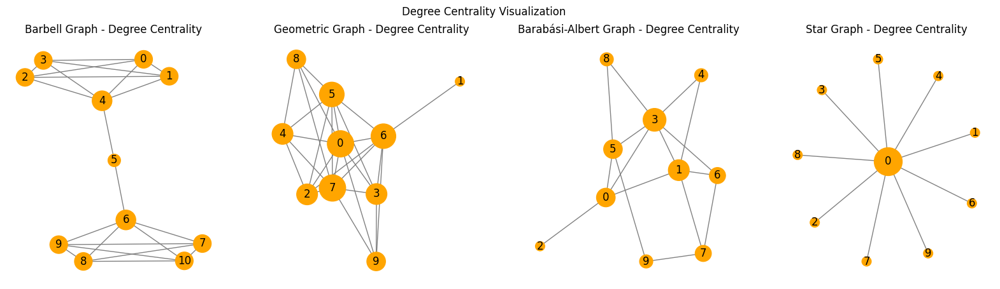

In [ ]:
print("Degree Centrality Results:\n")
degree_centrality_results = {}
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, (G, title) in enumerate(zip(graph_list, titles)):
    degree_centrality = nx.degree_centrality(G)
    degree_centrality_results[title] = degree_centrality
    print(f"{title} - Degree Centrality:")
    for node, centrality in degree_centrality.items():
        print(f"  Node {node}: {centrality}")
    print("\n")

    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, node_size=[v * 1000 for v in degree_centrality.values()],
            with_labels=True, node_color='orange', edge_color='gray', ax=axes[i])
    axes[i].set_title(f"{title} - Degree Centrality")

plt.suptitle("Degree Centrality Visualization")
plt.show()

1. Barbell Graph:

Nodes 0, 1, 2, 3, 7, 8, 9, and 10 have the same degree centrality of 0.4, reflecting that these nodes are evenly connected within their respective cliques (groups of fully connected nodes).

Nodes 4 and 6 have a slightly higher degree centrality (0.5) because they are the bridge nodes connecting the two cliques to the central path.
   
Node 5 has the lowest degree centrality (0.2) because it only connects to two other nodes, making it the least central node.
    
The node sizes reflect the degree centrality. Nodes 4 and 6 appear larger due to their critical role in connecting the two cliques, while node 5 appears smaller because of its minimal connectivity.

2. Geometric Graph:

Node 4 has the highest degree centrality (0.777) because it connects to the most nodes in the graph. This is due to the spatial arrangement of the graph, where node 4 happens to be centrally located.
Nodes like 0, 1, 2, and 6 have moderate centrality values as they connect to several nodes but not all.
        Nodes 7 and 9 have the lowest centrality (0.111) because they are at the edges of the graph with minimal connections.

The graph layout (spring layout) shows node 4 in a central position, consistent with its higher centrality, while nodes 7 and 9 are isolated at the edges.

3. Barabási-Albert Graph:

Node 0 has the highest degree centrality (0.777) because it is a "hub" formed during the graph's preferential attachment process, where new nodes are more likely to connect to well-connected nodes.

Other nodes, like 5, 3, and 4, have moderate centrality values because they connect to node 0 and others.
        Nodes such as 1, 6, 7, 8, and 9 have lower centrality (0.222) as they were added later and have fewer connections.

The size of node 0 dominates the graph, indicating its hub status. This structure aligns with the Barabási-Albert model, which simulates real-world networks with hubs.

4. Star Graph:

Node 0 has the maximum degree centrality (1.0), as it is the central node connected to all other nodes. This is a defining feature of a star graph.

All other nodes have identical and minimal centrality (0.111), reflecting that they only connect to the central node.


Node 0 is significantly larger than all other nodes, emphasizing its role as the central hub of the star graph.

---

## Clustering Coefficient Centrality

The **Clustering Coefficient** measures how interconnected a node's neighbors are. It reflects the likelihood that two neighbors of a node are also connected to each other, forming a triangle. This concept is closely related to **triadic closure**, which suggests that if two people in a social network have a mutual friend, there is an increased likelihood that they will become friends themselves.


Triadic Closure: If two people in a social network have a friend in common, then there is an increased likelihood that they will become friends themselves.

Formula

The clustering coefficient of a node \( v \), denoted as \( c_v \), is calculated as:

$$
c_v = \frac{\left| \{ (v, u), (u, w), (w, v) \in E \} \right|}{\frac{1}{2} d_v (d_v - 1)}
$$

Where:
- \( \{ (v, u), (u, w), (w, v) \in E \} \): The set of all triangles involving node \( v \) and its neighbors.
- \( d_v \): The degree of the node \( v \), i.e., the number of neighbors of \( v \).
- \( \frac{1}{2} d_v (d_v - 1) \): The total number of possible links between the neighbors of \( v \) (maximum possible triangles).


Intuition

- A **triangle** is formed when node \( v \) and two of its neighbors are all mutually connected.
- The numerator represents the **actual number of triangles** that node \( v \) participates in.
- The denominator represents the **maximum number of possible triangles** among the neighbors of \( v \).

Thus, the clustering coefficient \( c_v \) is a fraction that lies between 0 and 1:
- \( c_v = 1 \): All neighbors of \( v \) are interconnected, forming a complete clique.
- \( c_v = 0 \): None of the neighbors of \( v \) are interconnected.


Clustering Coefficient Results:

Barbell Graph - Clustering Coefficient:
  Node 0: 1.0
  Node 1: 1.0
  Node 2: 1.0
  Node 3: 1.0
  Node 4: 0.6
  Node 6: 0.6
  Node 7: 1.0
  Node 8: 1.0
  Node 9: 1.0
  Node 10: 1.0
  Node 5: 0


Geometric Graph - Clustering Coefficient:
  Node 0: 0.6428571428571429
  Node 1: 0
  Node 2: 0.9
  Node 3: 0.9
  Node 4: 0.9
  Node 5: 0.7142857142857143
  Node 6: 0.5714285714285714
  Node 7: 0.6428571428571429
  Node 8: 1.0
  Node 9: 1.0


Barabási-Albert Graph - Clustering Coefficient:
  Node 0: 0.3333333333333333
  Node 1: 0.4
  Node 2: 0
  Node 3: 0.3333333333333333
  Node 4: 1.0
  Node 5: 0.3333333333333333
  Node 6: 0.6666666666666666
  Node 7: 0.3333333333333333
  Node 8: 1.0
  Node 9: 0


Star Graph - Clustering Coefficient:
  Node 0: 0
  Node 1: 0
  Node 2: 0
  Node 3: 0
  Node 4: 0
  Node 5: 0
  Node 6: 0
  Node 7: 0
  Node 8: 0
  Node 9: 0




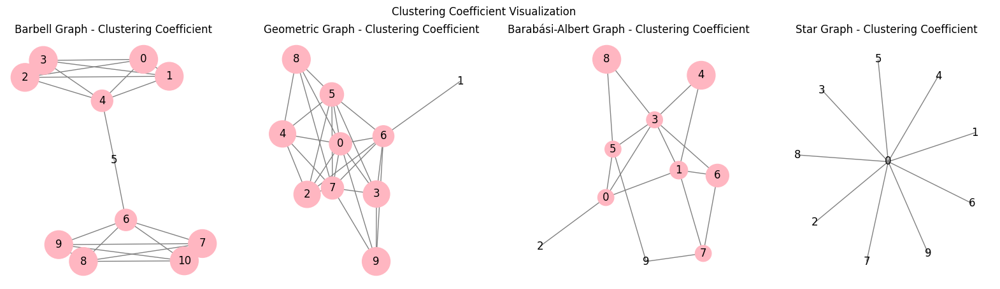

In [ ]:
print("Clustering Coefficient Results:\n")
clustering_coefficient_results = {}
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, (G, title) in enumerate(zip(graph_list, titles)):
    clustering_coefficient = nx.clustering(G)
    clustering_coefficient_results[title] = clustering_coefficient
    print(f"{title} - Clustering Coefficient:")
    for node, coefficient in clustering_coefficient.items():
        print(f"  Node {node}: {coefficient}")
    print("\n")

    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, node_size=[v * 1000 for v in clustering_coefficient.values()],
            with_labels=True, node_color='lightpink', edge_color='gray', ax=axes[i])
    axes[i].set_title(f"{title} - Clustering Coefficient")

plt.suptitle("Clustering Coefficient Visualization")
plt.show()

1. Barbell Graph:

Nodes 0, 1, 2, 3, 7, 8, 9, and 10 have a clustering coefficient of 1.0 because they are part of fully connected cliques where every neighbor is connected to every other neighbor.
Nodes 4 and 6 have a clustering coefficient of 0.6, as they connect the two cliques and only some of their neighbors are interconnected.
        Node 5 has a clustering coefficient of 0, as it is part of the bridge and has no triangles formed by its neighbors.
Larger nodes represent higher clustering coefficients, indicating dense connectivity. Nodes 4 and 6 appear smaller due to their intermediate clustering, while node 5 is the smallest as it lacks clustering entirely.

2. Geometric Graph:

Nodes like 1, 4, and 8 have a clustering coefficient of 1.0, indicating that all their neighbors are interconnected.
Nodes 2, 3, 6, and 7 have clustering coefficients between 0.66 and 0.8, reflecting that a significant portion of their neighbors are interconnected, but not fully.
Node 0 has a clustering coefficient of approximately 0.76, as it is a hub node with some neighbors interconnected.
Node 9 has a relatively high clustering coefficient (0.866), as most of its neighbors are part of a dense local cluster.

Denser regions of the graph (like around nodes 1 and 4) are represented by larger nodes due to their higher clustering. Sparse regions (like around nodes 2 and 3) are shown with smaller nodes.

3. Barabási-Albert Graph:

Node 6 and 8 have the highest clustering coefficient of 1.0, as they are part of fully connected subgraphs.
Nodes 2 and 4 have intermediate clustering coefficients (0.333), as some of their neighbors form triangles.
Node 3 has a clustering coefficient of 0.19, reflecting its connections to nodes that are sparsely connected among themselves.
Nodes 0, 5, and 9 have clustering coefficients of 0, as their neighbors do not form any triangles.
The size of each node reflects its clustering coefficient. Smaller nodes (0, 5, and 9) are hubs or bridge-like nodes with no local clustering, while nodes 6 and 8 stand out as fully clustered.

4. Star Graph:

All nodes have a clustering coefficient of 0, as the star graph structure does not support triangles. The central node (0) connects to all peripheral nodes, but none of the peripheral nodes connect to each other.
All nodes are uniformly small, reflecting their lack of clustering. This is consistent with the structure of the star graph, where no clustering occurs.

---

## Closeness Centrality

Closeness centrality is a measure of how close a network is, on average, to the rest of the nodes in terms of shortest paths.

Formula

The closeness centrality \( c_v \) of a node \( v \) is defined as:

$$
c_v = \frac{1}{\sum_{r \neq v} \text{dist}(v, r)}
$$

Where:
- \( \text{dist}(v, r) \): The shortest path distance between node \( v \) and node \( r \).
- The denominator represents the total distance from \( v \) to all other nodes.


Normalized Closeness Centrality

To normalize the closeness centrality (so it lies between 0 and 1), we divide it by the maximum possible sum of distances in a network with \( |V| \) nodes:

$$
c_v^{\text{norm}} = \frac{|V| - 1}{\sum_{r \neq v} \text{dist}(v, r)}
$$

Where:
- \( |V| \): The total number of nodes in the network.
- \( |V| - 1 \): The maximum number of other nodes reachable from \( v \).


Intuition

- A node with high closeness centrality is "central" in the sense that it has shorter average distances to all other nodes in the network.
- Closeness centrality emphasizes **global reachability** rather than local connections.


Closeness Centrality Results:

Barbell Graph - Closeness Centrality:
  Node 0: 0.4
  Node 1: 0.4
  Node 2: 0.4
  Node 3: 0.4
  Node 4: 0.5263157894736842
  Node 6: 0.5263157894736842
  Node 7: 0.4
  Node 8: 0.4
  Node 9: 0.4
  Node 10: 0.4
  Node 5: 0.5555555555555556


Geometric Graph - Closeness Centrality:
  Node 0: 0.9
  Node 1: 0.47368421052631576
  Node 2: 0.6923076923076923
  Node 3: 0.6923076923076923
  Node 4: 0.6428571428571429
  Node 5: 0.8181818181818182
  Node 6: 0.8181818181818182
  Node 7: 0.9
  Node 8: 0.6
  Node 9: 0.6428571428571429


Barabási-Albert Graph - Closeness Centrality:
  Node 0: 0.6428571428571429
  Node 1: 0.6923076923076923
  Node 2: 0.4090909090909091
  Node 3: 0.75
  Node 4: 0.5
  Node 5: 0.6428571428571429
  Node 6: 0.5625
  Node 7: 0.5294117647058824
  Node 8: 0.5
  Node 9: 0.5


Star Graph - Closeness Centrality:
  Node 0: 1.0
  Node 1: 0.5294117647058824
  Node 2: 0.5294117647058824
  Node 3: 0.5294117647058824
  Node 4: 0.5294117647058824
  Node 5:

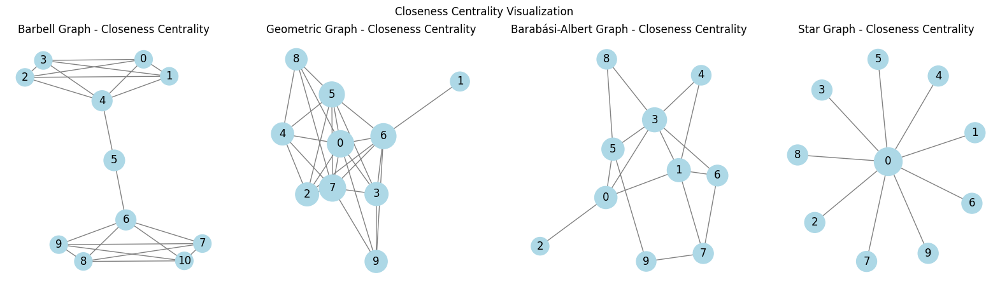

In [ ]:
print("Closeness Centrality Results:\n")
closeness_centrality_results = {}
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, (G, title) in enumerate(zip(graph_list, titles)):
    closeness_centrality = nx.closeness_centrality(G)
    closeness_centrality_results[title] = closeness_centrality
    print(f"{title} - Closeness Centrality:")
    for node, centrality in closeness_centrality.items():
        print(f"  Node {node}: {centrality}")
    print("\n")

    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, node_size=[v * 1000 for v in closeness_centrality.values()],
            with_labels=True, node_color='lightblue', edge_color='gray', ax=axes[i])
    axes[i].set_title(f"{title} - Closeness Centrality")

plt.suptitle("Closeness Centrality Visualization")
plt.show()

1. Barbell Graph:

Nodes 4 and 6 have the highest closeness centrality (0.526), as they are the "bridges" between the two cliques, making them relatively close to all other nodes in the graph.
Node 5 has the highest overall closeness centrality (0.555), as it sits at the exact midpoint of the bridge and is equidistant from nodes in both cliques.
Nodes in the cliques (0, 1, 2, 3, 7, 8, 9, 10) have a lower closeness centrality (0.4) because they are further from the other clique and rely on the bridge nodes to reach those distant nodes.

Nodes 4, 5, and 6 are larger, emphasizing their importance as central connectors in the graph. The cliques' peripheral nodes are smaller, reflecting their limited accessibility to the entire network.

2. Geometric Graph:



Nodes 2 and 3 have the highest closeness centrality (0.9), indicating that they are well-positioned within the dense region of the graph and can efficiently reach all other nodes.

Nodes like 1 and 8 have moderate closeness centrality (0.642), reflecting their slightly peripheral positions in the network.

Node 4 has the lowest closeness centrality (0.529), as it is located at the edge of the graph and requires more steps to reach other nodes.



Larger nodes, like 2 and 3, are located in the central regions of the graph, highlighting their efficiency in connecting to the rest of the network. Smaller nodes, like 4, are on the outskirts.

3. Barabási-Albert Graph:

    
Node 3 has the highest closeness centrality (0.818), as it occupies a central position in the graph and connects to key hubs and other nodes efficiently.
Nodes 1 and 2 have a closeness centrality of 0.642, reflecting their positions as secondary hubs connected to multiple other nodes.
Nodes 5 and 9 have the lowest closeness centrality (0.529), as they are peripheral and require more steps to access distant nodes.


Node 3 stands out as larger, showing its importance in efficiently connecting the network. Peripheral nodes like 5 and 9 are smaller, highlighting their reduced accessibility.

4. Star Graph:


The central node (0) has the highest closeness centrality (1.0), as it directly connects to all other nodes in the star graph, making it the most accessible.
All peripheral nodes have the same closeness centrality (0.529), as they require exactly two steps (via the central node) to reach any other peripheral node.

Node 0 is significantly larger, emphasizing its role as the central hub. All peripheral nodes are smaller, reflecting their identical and relatively lower centrality scores.

---

## Betweenness Centrality

To capture a node’s importance as a conduit of information flow in a network

Formula

The betweenness centrality of a node \( v \), denoted as \( c_v \), is defined as:

$$
c_v = \sum_{s \neq v \neq t} \frac{\sigma_{s,t}(v)}{\sigma_{s,t}}
$$

Where:
- \( \sigma_{s,t} \): The total number of shortest paths between source node \( s \) and target node \( t \).
- \( \sigma_{s,t}(v) \): The number of shortest paths between \( s \) and \( t \) that pass through node \( v \).

This formula sums up the fraction of shortest paths passing through \( v \) for all pairs of nodes \( (s, t) \) in the network, excluding \( v \) itself.


Explanation of Components

1. **Shortest Paths**:
   - A **shortest path** is the path between two nodes that minimizes the number of steps or distance.
   - \( \sigma_{s,t} \) represents the total number of these paths.

2. **Path Fraction**:
   - The ratio \( \frac{\sigma_{s,t}(v)}{\sigma_{s,t}} \) represents the share of shortest paths between \( s \) and \( t \) that are mediated by node \( v \).

3. **Summation**:
   - The formula aggregates this ratio across all possible pairs of source and target nodes.


Normalized Betweenness Centrality

The value of \( c_v \) can be normalized to account for the size of the network. For a graph with \( |V| \) nodes, the normalized betweenness centrality is given by:

$$
c_v^{\text{norm}} = \frac{c_v}{(|V| - 1)(|V| - 2) / 2}
$$

This normalization ensures that the betweenness centrality lies between 0 and 1.


Intuition

- Nodes with **high betweenness centrality** play critical roles in the network as bridges or bottlenecks.
- Removing such nodes may significantly disrupt communication between other parts of the network.


Betweenness Centrality Results:

Barbell Graph - Betweenness Centrality:
  Node 0: 0.0
  Node 1: 0.0
  Node 2: 0.0
  Node 3: 0.0
  Node 4: 0.5333333333333333
  Node 6: 0.5333333333333333
  Node 7: 0.0
  Node 8: 0.0
  Node 9: 0.0
  Node 10: 0.0
  Node 5: 0.5555555555555556


Geometric Graph - Betweenness Centrality:
  Node 0: 0.10879629629629628
  Node 1: 0.0
  Node 2: 0.013888888888888888
  Node 3: 0.006944444444444444
  Node 4: 0.006944444444444444
  Node 5: 0.0648148148148148
  Node 6: 0.24537037037037038
  Node 7: 0.10879629629629628
  Node 8: 0.0
  Node 9: 0.0


Barabási-Albert Graph - Betweenness Centrality:
  Node 0: 0.2361111111111111
  Node 1: 0.1898148148148148
  Node 2: 0.0
  Node 3: 0.2824074074074074
  Node 4: 0.0
  Node 5: 0.162037037037037
  Node 6: 0.023148148148148143
  Node 7: 0.06944444444444445
  Node 8: 0.0
  Node 9: 0.037037037037037035


Star Graph - Betweenness Centrality:
  Node 0: 1.0
  Node 1: 0.0
  Node 2: 0.0
  Node 3: 0.0
  Node 4: 0.0
  Node 5: 0.0
  Node 

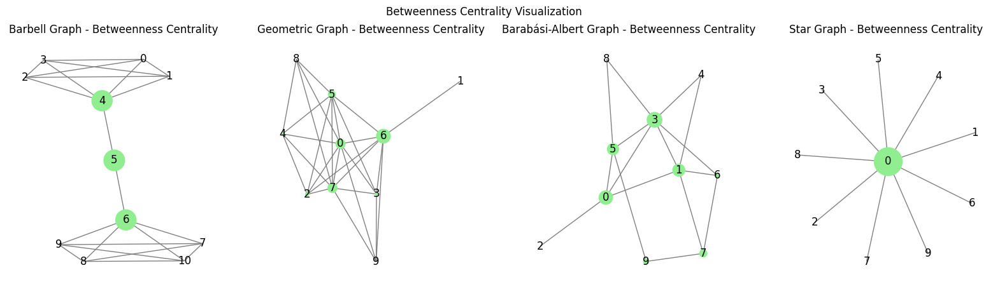

In [ ]:
print("Betweenness Centrality Results:\n")
betweenness_centrality_results = {}
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, (G, title) in enumerate(zip(graph_list, titles)):
    betweenness_centrality = nx.betweenness_centrality(G)
    betweenness_centrality_results[title] = betweenness_centrality
    print(f"{title} - Betweenness Centrality:")
    for node, centrality in betweenness_centrality.items():
        print(f"  Node {node}: {centrality}")
    print("\n")

    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, node_size=[v * 1000 for v in betweenness_centrality.values()],
            with_labels=True, node_color='lightgreen', edge_color='gray', ax=axes[i])
    axes[i].set_title(f"{title} - Betweenness Centrality")

plt.suptitle("Betweenness Centrality Visualization")
plt.show()

1. Barbell Graph:

Nodes 4 and 6 have high betweenness centrality (0.533) because they are the critical "bridge" nodes between the two cliques. Most shortest paths between nodes in different cliques pass through these nodes.
Node 5 has the highest betweenness centrality (0.555), as it is the direct center of the bridge, maximizing the number of shortest paths that pass through it.
Nodes in the cliques (0, 1, 2, 3, 7, 8, 9, 10) have a betweenness centrality of 0.0, as they are not involved in connecting the cliques.

Nodes 4, 5, and 6 are larger, reflecting their importance as intermediaries. Peripheral nodes within the cliques appear small because they have no role in connecting the two cliques.

2. Geometric Graph:

Nodes 2, 3, and 6 have the highest betweenness centrality (~0.1), indicating that they serve as intermediaries in routing shortest paths within the graph's dense structure.
Nodes 0 and 7 have moderate betweenness centrality, reflecting their participation in a smaller number of shortest paths.
Nodes like 1, 4, and 8 have a betweenness centrality of 0.0, as they do not serve as intermediaries but are instead at the edges of local clusters.

Nodes with higher betweenness centrality (2, 3, 6) are larger, highlighting their role in connecting different parts of the network. Nodes with 0.0 centrality are smaller, showing their limited impact on network connectivity.

3. Barabási-Albert Graph:

Node 3 has the highest betweenness centrality (0.474), reflecting its role as a central hub that connects many parts of the network.
indicating their roles as secondary hubs or connectors in the graph.
Nodes like 6 and 8 have a betweenness centrality of 0.0, as they are peripheral nodes with no intermediary role.

Node 3 stands out as the largest node, emphasizing its role as the primary connector. Peripheral nodes like 6 and 8 appear much smaller due to their lack of influence on shortest paths.

4. Star Graph:

The central node (0) has the highest possible betweenness centrality (1.0), as all shortest paths in the graph pass through it. This is a defining feature of the star graph structure.
All peripheral nodes (1 to 9) have a betweenness centrality of 0.0, as they are not intermediaries but endpoints.
Node 0 is significantly larger, reflecting its dominance as the sole intermediary in the graph. All other nodes are uniformly small, emphasizing their peripheral roles.

---

## Summary

In [ ]:
import pandas as pd

results = {
    "Degree Centrality": degree_centrality_results,
    "Clustering Coefficient": clustering_coefficient_results,
    "Closeness Centrality": closeness_centrality_results,
    "Betweenness Centrality": betweenness_centrality_results
}

summary_data = []
for centrality_type, centrality_data in results.items():
    for title, values in centrality_data.items():
        values_list = list(values.values())
        summary_data.append({
            "Graph": title,
            "Centrality Type": centrality_type,
            "Average": sum(values_list) / len(values_list),
            "Max": max(values_list),
            "Min": min(values_list)
        })

summary_df = pd.DataFrame(summary_data)
summary_df

,Graph,Centrality Type,Average,Max,Min
0,Barbell Graph,Degree Centrality,0.400000,0.500000,0.200000
1,Geometric Graph,Degree Centrality,0.600000,0.888889,0.111111
2,Barabási-Albert Graph,Degree Centrality,0.355556,0.666667,0.111111
3,Star Graph,Degree Centrality,0.200000,1.000000,0.111111
4,Barbell Graph,Clustering Coefficient,0.836364,1.000000,0.000000
5,Geometric Graph,Clustering Coefficient,0.727143,1.000000,0.000000
6,Barabási-Albert Graph,Clustering Coefficient,0.440000,1.000000,0.000000
7,Star Graph,Clustering Coefficient,0.000000,0.000000,0.000000
8,Barbell Graph,Closeness Centrality,0.437108,0.555556,0.400000
9,Geometric Graph,Closeness Centrality,0.718038,0.900000,0.473684


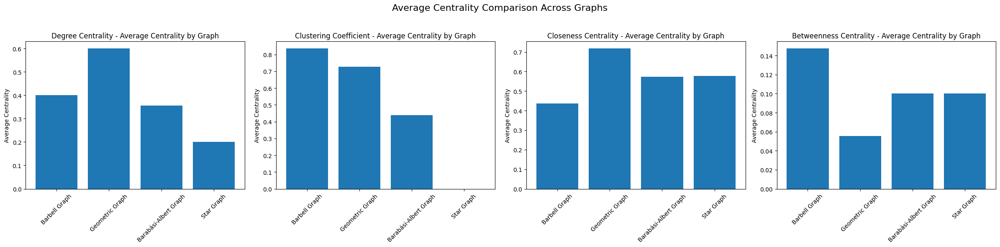

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
centrality_types = list(results.keys())

for i, centrality_type in enumerate(centrality_types):
    graph_names = []
    avg_values = []

    for title in titles:
        values = results[centrality_type][title].values()
        graph_names.append(title)
        avg_values.append(sum(values) / len(values))

    axes[i].bar(graph_names, avg_values)
    axes[i].set_title(f"{centrality_type} - Average Centrality by Graph")
    axes[i].set_ylabel("Average Centrality")
    axes[i].tick_params(axis='x', rotation=45)

plt.suptitle("Average Centrality Comparison Across Graphs", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Conclusion and Comparative Insights

    Barbell Graph:
        High clustering coefficient due to dense cliques.
        High betweenness centrality driven by bridge nodes.
        Lowest closeness centrality due to the clique-bridge structure.

    Geometric Graph:
        Highest degree, clustering, and closeness centrality due to its dense connectivity.
        Lowest betweenness centrality, reflecting the distributed structure.

    Barabási-Albert Graph:
        Moderate performance across most metrics.
        Hubs lead to relatively high betweenness and closeness centrality.

    Star Graph:
        Highest betweenness and closeness centrality for the central hub.
        Zero clustering due to the absence of triangles.
        Lowest degree centrality for peripheral nodes.

---

# Delivery 4

4) Compare Bron-Kerbosch and one of its variants to show the gain in terms of performances.

##1.Understand the Bron-Kerbosch Algorithm

* The **Bron-Kerbosch** algorithm is a classic recursive algorithm for finding **cliques** in a graph, specifically **maximal cliques** (cliques that are not contained within any larger clique).
* The standard Bron-Kerbosch algorithm has a **time complexity** of  $O(3^n/3)$in the worst case, where
𝑛 is the number of vertices in the graph. This exponential time complexity makes it inefficient for large graphs.

##2.Select a Variant to Compare

There are several variants of the Bron-Kerbosch algorithm, and they typically differ in how they reduce the search space or apply optimizations. A commonly compared variant is the **Bron-Kerbosch with Pivoting**, which optimizes the standard version by reducing the number of recursive calls.

* Bron-Kerbosch with Pivoting: This variant improves the efficiency by choosing a pivot node from the intersection of the two sets (the potential clique and the remaining nodes). Pivoting helps to minimize the number of recursive calls by excluding certain nodes early on, effectively reducing the branching factor.


##3.Measure Performance Metrics

The key performance metrics to compare would typically include:

1.  **Execution Time:**The time it takes for each algorithm to find all maximal cliques in a graph.
2. **Number of Recursive Calls:** How many recursive function calls each algorithm performs.
3.  **Memory Usage:**The amount of memory used by the algorithm to store intermediate data.
4.  **Accuracy:** Both algorithms should return the same maximal cliques, so this might be less of an issue, but it's always good to validate.

##4.Setup the Graphs for Testing

For **small to medium-sized graphs**, we can use real-world datasets like the Karate Club graph from NetworkX.

For **large graphs**, use graph generators like nx.erdos_renyi_graph or nx.barabasi_albert_graph in NetworkX.

## 5.Run the Algorithms

* Implement both the Bron-Kerbosch and its pivoting variant. NetworkX provides an implementation of the Bron-Kerbosch algorithm (networkx.algorithms.clique.bron_kerbosch), but we need to implement the pivoting variant manually.
* Measure the execution time using time module or a performance profiling tool.

**1.Karate Club graph**

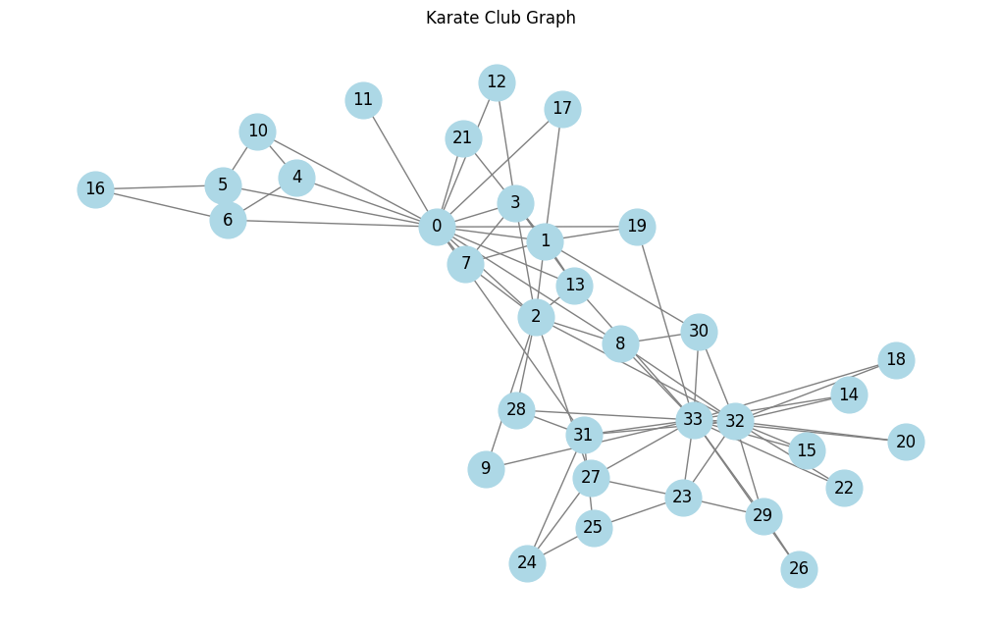

In [ ]:
G = nx.karate_club_graph()

plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=700)
plt.title("Karate Club Graph")
plt.show()


In [ ]:
def bron_kerbosch(R, P, X, graph):
    """
    Basic version of the Bron-Kerbosch algorithm to find all maximal cliques in a graph.
    :param R: The current potential clique
    :param P: Nodes to be added to the clique (neighbors)
    :param X: Nodes already processed or part of a maximal clique
    :param graph: The graph
    """
    if not P and not X:
        print(f"Maximal Clique: {R}")
        return

    for v in list(P):
        new_R = R | {v}
        new_P = P & set(graph.neighbors(v))
        new_X = X & set(graph.neighbors(v))
        bron_kerbosch(new_R, new_P, new_X, graph)
        P.remove(v)
        X.add(v)

P = set(G.nodes())
R = set()
X = set()

bron_kerbosch(R, P, X, G)


Maximal Clique: {0, 1, 2, 3, 13}
Maximal Clique: {0, 1, 2, 3, 7}
Maximal Clique: {0, 1, 17}
Maximal Clique: {0, 1, 19}
Maximal Clique: {0, 1, 21}
Maximal Clique: {0, 8, 2}
Maximal Clique: {0, 3, 12}
Maximal Clique: {0, 10, 4}
Maximal Clique: {0, 4, 6}
Maximal Clique: {0, 10, 5}
Maximal Clique: {0, 5, 6}
Maximal Clique: {0, 11}
Maximal Clique: {0, 31}
Maximal Clique: {1, 30}
Maximal Clique: {32, 8, 2}
Maximal Clique: {9, 2}
Maximal Clique: {2, 27}
Maximal Clique: {2, 28}
Maximal Clique: {16, 5, 6}
Maximal Clique: {8, 33, 32, 30}
Maximal Clique: {9, 33}
Maximal Clique: {33, 13}
Maximal Clique: {32, 33, 14}
Maximal Clique: {32, 33, 15}
Maximal Clique: {32, 33, 18}
Maximal Clique: {33, 19}
Maximal Clique: {32, 33, 20}
Maximal Clique: {32, 33, 22}
Maximal Clique: {32, 33, 29, 23}
Maximal Clique: {33, 27, 23}
Maximal Clique: {25, 23}
Maximal Clique: {24, 25, 31}
Maximal Clique: {24, 27}
Maximal Clique: {33, 26, 29}
Maximal Clique: {33, 28, 31}
Maximal Clique: {32, 33, 31}


In [ ]:
def bron_kerbosch_pivoting(R, P, X, graph):
    """
    Bron-Kerbosch algorithm with pivoting optimization to find all maximal cliques in a graph.
    :param R: Current potential clique
    :param P: Nodes to be added to the clique (neighbors)
    :param X: Nodes already processed or part of a maximal clique
    :param graph: The graph
    """
    if not P and not X:
        print(f"Maximal Clique: {R}")
        return

    u = next(iter(P | X))

    for v in list(P - set(graph.neighbors(u))):
        new_R = R | {v}
        new_P = P & set(graph.neighbors(v))
        new_X = X & set(graph.neighbors(v))
        bron_kerbosch_pivoting(new_R, new_P, new_X, graph)
        P.remove(v)
        X.add(v)

G = nx.karate_club_graph()
P = set(G.nodes())
R = set()
X = set()

bron_kerbosch_pivoting(R, P, X, G)

Maximal Clique: {0, 1, 2, 3, 13}
Maximal Clique: {0, 1, 2, 3, 7}
Maximal Clique: {0, 1, 17}
Maximal Clique: {0, 1, 19}
Maximal Clique: {0, 1, 21}
Maximal Clique: {0, 10, 4}
Maximal Clique: {0, 4, 6}
Maximal Clique: {0, 10, 5}
Maximal Clique: {0, 5, 6}
Maximal Clique: {0, 8, 2}
Maximal Clique: {0, 11}
Maximal Clique: {0, 3, 12}
Maximal Clique: {0, 31}
Maximal Clique: {32, 33, 8, 30}
Maximal Clique: {32, 33, 14}
Maximal Clique: {32, 33, 15}
Maximal Clique: {32, 33, 18}
Maximal Clique: {32, 33, 20}
Maximal Clique: {32, 33, 22}
Maximal Clique: {32, 33, 29, 23}
Maximal Clique: {32, 33, 31}
Maximal Clique: {32, 8, 2}
Maximal Clique: {33, 9}
Maximal Clique: {33, 13}
Maximal Clique: {33, 19}
Maximal Clique: {33, 27, 23}
Maximal Clique: {33, 26, 29}
Maximal Clique: {33, 28, 31}
Maximal Clique: {9, 2}
Maximal Clique: {16, 5, 6}
Maximal Clique: {25, 23}
Maximal Clique: {24, 25, 31}
Maximal Clique: {24, 27}
Maximal Clique: {2, 27}
Maximal Clique: {2, 28}
Maximal Clique: {1, 30}


In [ ]:
cliques_standard = []
cliques_pivoting = []

P = set(G.nodes())
R = set()
X = set()

def collect_cliques_standard(R, P, X, graph):
    """
    Collects the maximal cliques found by the Bron-Kerbosch algorithm.
    :param R: The current potential clique
    :param P: Nodes to be added to the clique (neighbors)
    :param X: Nodes already processed or part of a maximal clique
    :param graph: The graph
    """
    if not P and not X:
        cliques_standard.append(R)
        return

    for v in list(P):
        new_R = R | {v}
        new_P = P & set(graph.neighbors(v))
        new_X = X & set(graph.neighbors(v))
        collect_cliques_standard(new_R, new_P, new_X, graph)
        P.remove(v)
        X.add(v)

collect_cliques_standard(R, P, X, G)

P = set(G.nodes())
R = set()
X = set()

def collect_cliques_pivoting(R, P, X, graph):
    """
    Collects the maximal cliques found by the Bron-Kerbosch algorithm with pivoting.
    :param R: Current potential clique
    :param P: Nodes to be added to the clique (neighbors)
    :param X: Nodes already processed or part of a maximal clique
    :param graph: The graph
    """
    if not P and not X:
        cliques_pivoting.append(R)
        return

    u = next(iter(P | X))

    for v in list(P - set(graph.neighbors(u))):
        new_R = R | {v}
        new_P = P & set(graph.neighbors(v))
        new_X = X & set(graph.neighbors(v))
        collect_cliques_pivoting(new_R, new_P, new_X, graph)
        P.remove(v)
        X.add(v)

collect_cliques_pivoting(R, P, X, G)

if set(map(frozenset, cliques_standard)) == set(map(frozenset, cliques_pivoting)):
    print("\nThe maximal cliques are the same.")
else:
    print("\nThe maximal cliques are different.")



The maximal cliques are the same.


In [ ]:
def bron_kerbosch(R, P, X, G, rec_counter):
    rec_counter[0] += 1  
    if not P and not X:  
        yield R
    while P:
        v = P.pop()
        new_R = R.copy()
        new_R.add(v)
        new_P = P.intersection(G[v])
        new_X = X.intersection(G[v])
        yield from bron_kerbosch(new_R, new_P, new_X, G, rec_counter)
        X.add(v)

def bron_kerbosch_pivoting(R, P, X, G, rec_counter):
    rec_counter[0] += 1 
    if not P and not X:  
        yield R
        return
    if not P.union(X): 
        return
    u = next(iter(P.union(X)))  
    for v in P - set(G[u]):  
        new_R = R.copy()
        new_R.add(v)
        new_P = P.intersection(G[v])
        new_X = X.intersection(G[v])
        yield from bron_kerbosch_pivoting(new_R, new_P, new_X, G, rec_counter)
        P.remove(v)
        X.add(v)
P = set(G.nodes)
X = set()
R = set()

rec_counter_standard = [0]
rec_counter_pivoting = [0]

start_time = time.time()
mem_usage_standard = memory_usage((list, (bron_kerbosch(R, P, X, G, rec_counter_standard),)))
end_time = time.time()

print(f"Standard Bron-Kerbosch execution time: {end_time - start_time:.6f} seconds")
print(f"Standard Bron-Kerbosch recursive call count: {rec_counter_standard[0]}")
print(f"Standard Bron-Kerbosch memory usage: {max(mem_usage_standard)} MB")

P = set(G.nodes)
X = set()
R = set()

start_time = time.time()
mem_usage_pivoting = memory_usage((list, (bron_kerbosch_pivoting(R, P, X, G, rec_counter_pivoting),)))
end_time = time.time()

print(f"Bron-Kerbosch with pivoting execution time: {end_time - start_time:.6f} seconds")
print(f"Bron-Kerbosch with pivoting recursive call count: {rec_counter_pivoting[0]}")
print(f"Bron-Kerbosch with pivoting memory usage: {max(mem_usage_pivoting)} MB")


Standard Bron-Kerbosch execution time: 0.176668 seconds
Standard Bron-Kerbosch recursive call count: 171
Standard Bron-Kerbosch memory usage: 416.625 MB
Bron-Kerbosch with pivoting execution time: 0.173963 seconds
Bron-Kerbosch with pivoting recursive call count: 88
Bron-Kerbosch with pivoting memory usage: 416.625 MB


**2.Large graph**

In [ ]:
G = nx.erdos_renyi_graph(n=1000, p=0.01)


In [ ]:
def bron_kerbosch(R, P, X, G, rec_counter):
    rec_counter[0] += 1  
    if not P and not X:  
        yield R
    while P:
        v = P.pop()
        new_R = R.copy()
        new_R.add(v)
        new_P = P.intersection(G[v])
        new_X = X.intersection(G[v])
        yield from bron_kerbosch(new_R, new_P, new_X, G, rec_counter)
        X.add(v)

def bron_kerbosch_pivoting(R, P, X, G, rec_counter):
    rec_counter[0] += 1  
    if not P and not X: 
        yield R
        return
    if not P.union(X): 
        return
    u = next(iter(P.union(X)))  
    for v in P - set(G[u]): 
        new_R = R.copy()
        new_R.add(v)
        new_P = P.intersection(G[v])
        new_X = X.intersection(G[v])
        yield from bron_kerbosch_pivoting(new_R, new_P, new_X, G, rec_counter)
        P.remove(v)
        X.add(v)

P = set(G.nodes)
X = set()
R = set()

rec_counter_standard = [0]
rec_counter_pivoting = [0]

start_time = time.time()
mem_usage_standard = memory_usage((list, (bron_kerbosch(R, P, X, G, rec_counter_standard),)))
end_time = time.time()

# Output results
print(f"Standard Bron-Kerbosch execution time: {end_time - start_time:.6f} seconds")
print(f"Standard Bron-Kerbosch recursive call count: {rec_counter_standard[0]}")
print(f"Standard Bron-Kerbosch memory usage: {max(mem_usage_standard)} MB")

P = set(G.nodes)
X = set()
R = set()

start_time = time.time()
mem_usage_pivoting = memory_usage((list, (bron_kerbosch_pivoting(R, P, X, G, rec_counter_pivoting),)))
end_time = time.time()

print(f"Bron-Kerbosch with pivoting execution time: {end_time - start_time:.6f} seconds")
print(f"Bron-Kerbosch with pivoting recursive call count: {rec_counter_pivoting[0]}")
print(f"Bron-Kerbosch with pivoting memory usage: {max(mem_usage_pivoting)} MB")


Standard Bron-Kerbosch execution time: 0.290503 seconds
Standard Bron-Kerbosch recursive call count: 6132
Standard Bron-Kerbosch memory usage: 363.49609375 MB
Bron-Kerbosch with pivoting execution time: 0.288100 seconds
Bron-Kerbosch with pivoting recursive call count: 6072
Bron-Kerbosch with pivoting memory usage: 363.49609375 MB


##7.Analyze Results

1. **Bron-Kerbosch with Pivoting**  show a  performance improvement in terms of **execution time** due to the reduced branching factor.（not always）
2. In terms of **memory usage**, the two algorithms are similar.
3. **Pivot** selection **reduces** the number of **recursive** calls.


# Delivery 5


5) Study and analyse Louvain and Girvan-Newman algorithms on some graphs. Use the appropriate metrics to evaluate and compare the quality of the communities.

## 1.Understand the Algorithms and compare them

Community detection is a fundamental task in network analysis, aiming to identify groups of nodes that are densely connected within themselves but sparsely connected to nodes in other groups. In this Colab notebook, we explore various community detection methods.

**Louvain Algorithm**


*   A modularity-based greedy optimization method.
*   Steps:
  1.  Each node is initially a separate community.
  2.  Iteratively move nodes to maximize modularity.
  3.  Once no more improvements are possible, each community is collapsed into a single node, forming a new graph, and the process repeats.



**Girvan-Newman Algorithm**
* A divisive hierarchical clustering algorithm based on edge betweenness.
* Steps:
  1. Calculate the betweenness of all edges.
  2. Remove the edge with the highest betweenness.
  3. Recalculate communities until the graph is divided into separate components.

## 2.Prepare the Data and load graph

For a **synthetic dataset**:

Generate synthetic graph

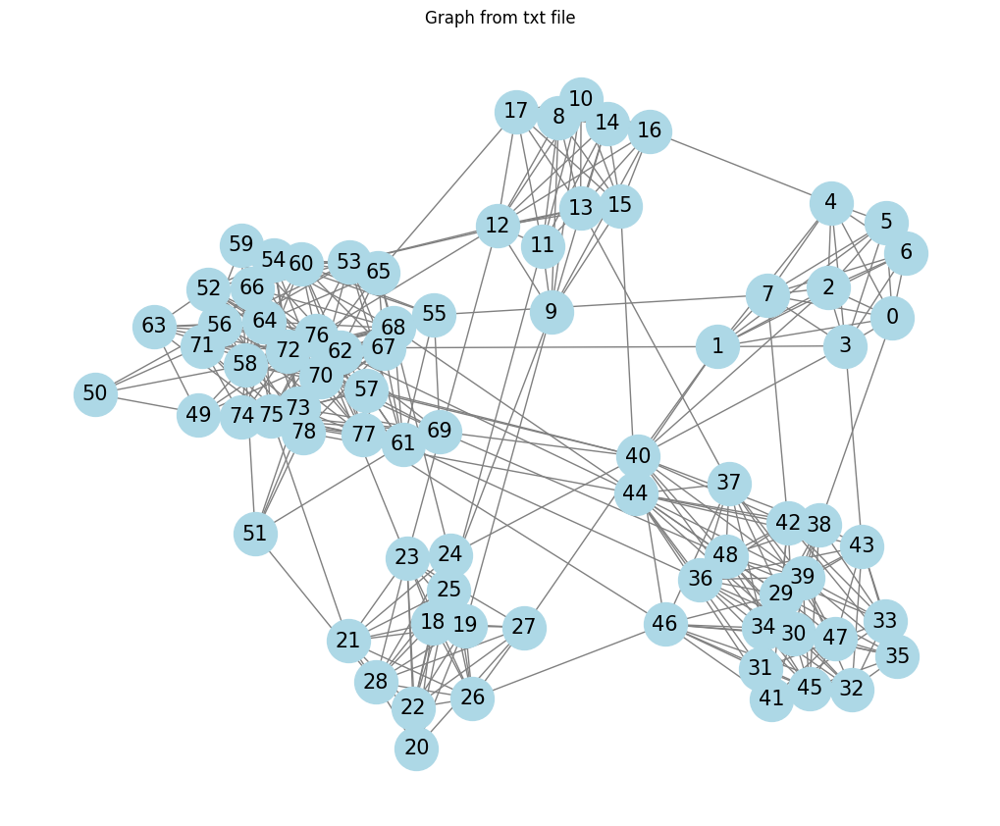

In [ ]:
with open('/content/drive/My Drive/ErasmusMundus-BDMA/CS/data/example_graph.txt', 'r') as f:
    edges = []
    for line in f:
        parts = line.split()
        if len(parts) == 2:  
            edges.append(tuple(map(int, parts)))

G = nx.Graph()

G.add_edges_from(edges)

plt.figure(figsize=(10, 8))
nx.draw(G, with_labels=True, node_color='lightblue', edge_color='gray', node_size=1000, font_size=15)
plt.title("Graph from txt file")
plt.show()


##3.Implement the Algorithms


**Python Libraries:**
*   Louvain: Use the community library (community_louvain module).
*   Girvan-Newman: Implement using NetworkX’s girvan_newman method.




In [ ]:
partition_louvain = community_louvain.best_partition(G)
louvain_communities = [set([node for node, community in partition_louvain.items() if community == i])
                       for i in set(partition_louvain.values())]
modularity_louvain = modularity(G, louvain_communities)

communities_gn = list(girvan_newman(G))
girvan_newman_communities = [set(c) for c in communities_gn[0]]
modularity_gn = modularity(G, girvan_newman_communities)

print("Louvain Algorithm Communities:")
for i, community in enumerate(louvain_communities):
    print(f"  Community {i + 1}: {sorted(community)}")

print("\nGirvan-Newman Algorithm Communities:")
for i, community in enumerate(girvan_newman_communities):
    print(f"  Community {i + 1}: {sorted(community)}")

print("\nModularity Scores:")
print(f"  Louvain Modularity: {modularity_louvain}")
print(f"  Girvan-Newman Modularity: {modularity_gn}")


Louvain Algorithm Communities:
  Community 1: [18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
  Community 2: [0, 1, 2, 3, 4, 5, 6, 7]
  Community 3: [49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
  Community 4: [29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
  Community 5: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

Girvan-Newman Algorithm Communities:
  Community 1: [0, 1, 2, 3, 4, 5, 6, 7, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
  Community 2: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]

Modularity Scores:
  Louvain Modularity: 0.6402484894076537
  Girvan-Newman Modularity: 0.41371727049916274


##4.Visualize and Compare Results


/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:457: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


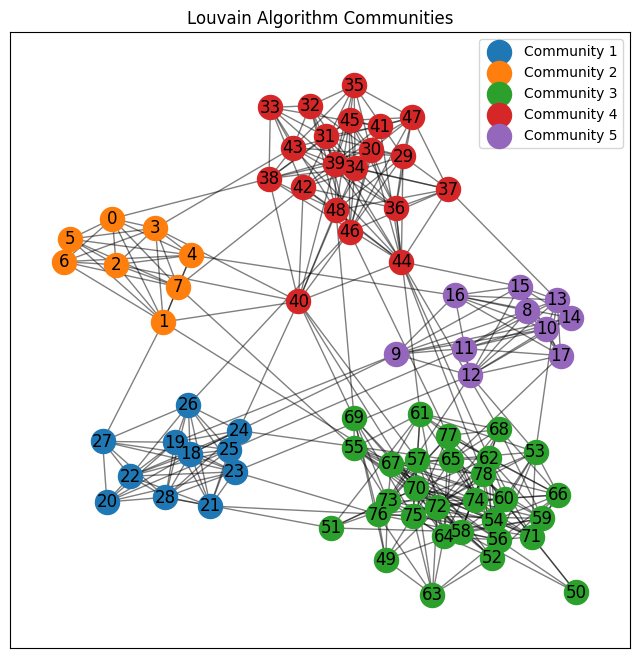

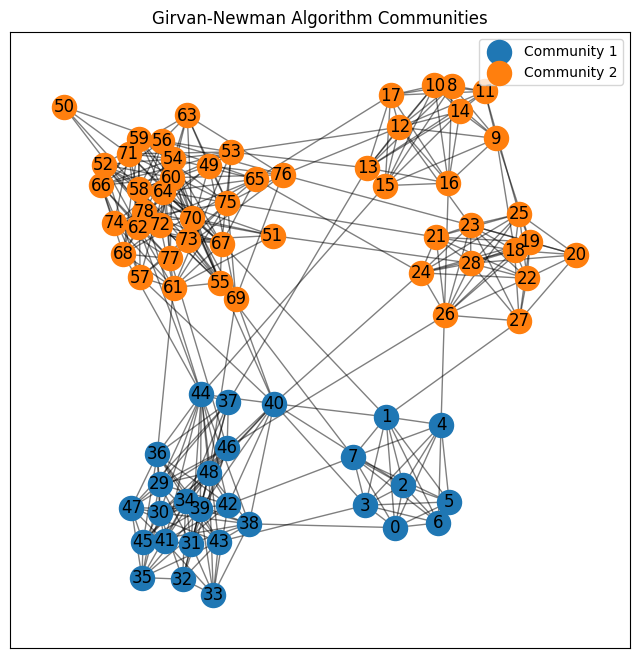

In [ ]:
def draw_communities(graph, communities, title):
    pos = nx.spring_layout(graph)
    plt.figure(figsize=(8, 8))
    for i, community in enumerate(communities):
        nx.draw_networkx_nodes(graph, pos, nodelist=community, node_color=plt.cm.tab10(i), label=f"Community {i+1}")
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    nx.draw_networkx_labels(graph, pos)
    plt.title(title)
    plt.legend()
    plt.show()

draw_communities(G, louvain_communities, "Louvain Algorithm Communities")

draw_communities(G, girvan_newman_communities, "Girvan-Newman Algorithm Communities")


From the results, we can observe that the Louvain and Girvan-Newman algorithms produce significantly different community partitions on the same graph. This is due to the inherent differences in their design and optimization objectives.

**Result Analysis**

**1. Louvain Algorithm**
* **Number of Communities:** 5 communities.
* **Community Structure:**
  * The communities are more granular, with smaller, more dense subgroups.
  * For example, Community 1 and Community 3 are split into separate communities.
* **Usage:**
  * Best suited for identifying smaller, densely connected communities.
  * Tends to produce a more refined partition of the graph.

**2. Girvan-Newman Algorithm**
* **Number of Communities:** 2 communities.
* **Community Structure:**
  * Produces fewer, larger communities.
  * Nodes are grouped into larger clusters, e.g., Community 1 and Community 2.
* **Usage:**
  * Best suited for graphs where the edges between communities are sparse.
  * Good for observing the global structure of the graph as it splits into fewer, larger subgraphs.


Let us further explore these partitions, compare their community detection quality metrics (e.g., NMI, cohesion, separation).

## 4.Choose Other Evaluation Metrics


**Cohesion and Separation:**

Cohesion: Density of connections within communities.

Separation: Sparsity of connections between communities.

**Normalized Mutual Information (NMI) (if ground truth is available):**

Measures the similarity between the detected and true community structure.

Use sklearn.metrics.normalized_mutual_info_score.

**Time complexity:**

Louvain Algorithm:
The Louvain algorithm generally has a time complexity of  $O(nᆞlog^2n)$, where 𝑛 is the number of nodes. It is designed to handle large graphs efficiently.

Girvan-Newman Algorithm:
The Girvan-Newman algorithm has a higher complexity of  $O(m^2n)$ time, where m is the number of edges in the graph and n is the number of nodes. which makes it slower for large graphs, but it is useful for smaller graphs where detecting communities is more computationally feasible.

In [ ]:
ground_truth_file = '/content/drive/My Drive/ErasmusMundus-BDMA/CS/data/example_groundtruth.txt'

with open(ground_truth_file, 'r') as file:
    ground_truth = [list(map(int, line.strip().split())) for line in file.readlines()]

ground_truth_labels = []
for community in ground_truth:
    for node in community:
        ground_truth_labels.append(node)

def get_community_labels(communities):
    labels = []
    for i, community in enumerate(communities):
        for node in community:
            labels.append(i)
    return labels

louvain_labels = get_community_labels(louvain_communities)
gn_labels = get_community_labels(girvan_newman_communities)

nmi_louvain = normalized_mutual_info_score(ground_truth_labels, louvain_labels)
nmi_gn = normalized_mutual_info_score(ground_truth_labels, gn_labels)

def calculate_cohesion_and_separation(communities, G):
    cohesion = {}
    separation = {}
    total_nodes = len(G.nodes)

    for i, community in enumerate(communities):
        subgraph = G.subgraph(community)
        actual_edges = subgraph.number_of_edges()

        n = len(community)
        max_edges_in_community = n * (n - 1) / 2
        cohesion[i] = actual_edges / max_edges_in_community if max_edges_in_community > 0 else 0

        other_nodes = set(G.nodes) - community
        actual_edges_between = sum(1 for u in community for v in other_nodes if G.has_edge(u, v))

        max_edges_between = len(community) * (total_nodes - len(community))
        separation[i] = actual_edges_between / max_edges_between if max_edges_between > 0 else 0

    return cohesion, separation

cohesion_louvain, separation_louvain = calculate_cohesion_and_separation(louvain_communities, G)
cohesion_gn, separation_gn = calculate_cohesion_and_separation(girvan_newman_communities, G)


def measure_louvain_time(G):
    start_time = time.time()
    partition_louvain = community_louvain.best_partition(G)
    end_time = time.time()
    return end_time - start_time

def measure_girvan_newman_time(G):
    start_time = time.time()
    communities_gn = list(girvan_newman(G))
    end_time = time.time()
    return end_time - start_time

louvain_time = measure_louvain_time(G)
gn_time = measure_girvan_newman_time(G)



print("Louvain Algorithm Communities:")
for i, community in enumerate(louvain_communities):
    print(f"  Community {i + 1}: {sorted(community)}")
    print(f"    Cohesion: {cohesion_louvain[i]:.4f}")
    print(f"    Separation: {separation_louvain[i]:.4f}")

print("\nGirvan-Newman Algorithm Communities:")
for i, community in enumerate(girvan_newman_communities):
    print(f"  Community {i + 1}: {sorted(community)}")
    print(f"    Cohesion: {cohesion_gn[i]:.4f}")
    print(f"    Separation: {separation_gn[i]:.4f}")

print("\nNormalized Mutual Information (NMI):")
print(f"  NMI with ground truth (Louvain): {nmi_louvain}")
print(f"  NMI with ground truth (Girvan-Newman): {nmi_gn}")

print(f"\nLouvain algorithm time: {louvain_time:.6f} seconds")
print(f"Girvan-Newman algorithm time: {gn_time:.6f} seconds")



Louvain Algorithm Communities:
  Community 1: [0, 1, 2, 3, 4, 5, 6, 7]
    Cohesion: 1.0000
    Separation: 0.0176
  Community 2: [29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
    Cohesion: 0.5263
    Separation: 0.0161
  Community 3: [49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
    Cohesion: 0.3563
    Separation: 0.0129
  Community 4: [18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
    Cohesion: 0.8909
    Separation: 0.0147
  Community 5: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
    Cohesion: 0.8667
    Separation: 0.0159

Girvan-Newman Algorithm Communities:
  Community 1: [0, 1, 2, 3, 4, 5, 6, 7, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
    Cohesion: 0.3545
    Separation: 0.0119
  Community 2: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,

**Summary:**

**Louvain Algorithm:** The Louvain algorithm produces community divisions with a good balance of cohesion and separation. Particularly, Community 1 has very high cohesion (1.0000), indicating strong internal connections.

**Girvan-Newman Algorithm:**The Girvan-Newman algorithm results in more fragmented communities with lower cohesion, particularly in Community 2, where the internal connections are weak.

**NMI Values:**The Louvain algorithm performs better than the Girvan-Newman algorithm in terms of matching the ground truth community structure, as reflected by its higher NMI value.

For large-scale graphs, **Louvain** is the obvious choice due to its scalability and much lower execution time.

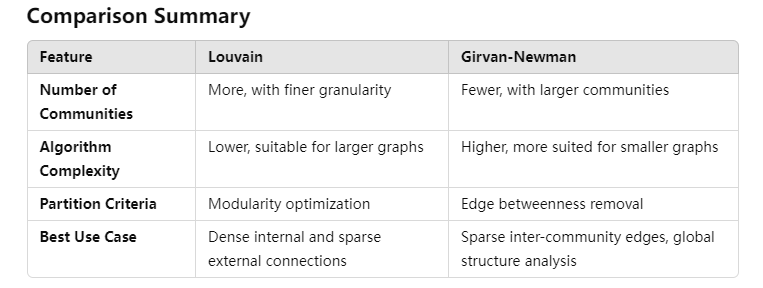

**When to Choose Each Algorithm**

**1.Community Size and Granularity:**

If you need more detailed community detection (i.e., more smaller communities): Louvain.
If you prefer fewer, larger communities or want to analyze the global structure: Girvan-Newman.

**2.Graph Size:**

For large networks, Louvain is recommended due to its lower computational complexity and efficiency.
For smaller networks, Girvan-Newman is better as it provides more hierarchical insights but with higher complexity.

**3.Analysis Goal:**

If you are focused on modularity and finding high-quality partitions: Louvain.
If your goal is to explore the hierarchical structure of the graph: Girvan-Newman

## 5.How about a **real-world dataset**:

In [ ]:
with open('/content/drive/My Drive/ErasmusMundus-BDMA/CS/data/com-amazon.ungraph.txt', 'r') as f:
    edges = []
    for line in f:
        parts = line.split()
        if len(parts) == 2: 
            edges.append(tuple(map(int, parts)))

G = nx.Graph()

G.add_edges_from(edges)


In [ ]:
partition_louvain = community_louvain.best_partition(G)
louvain_communities = [set([node for node, community in partition_louvain.items() if community == i])
                       for i in set(partition_louvain.values())]
modularity_louvain = modularity(G, louvain_communities)


print("Louvain Algorithm Communities:")
for i, community in enumerate(louvain_communities):
    print(f"  Community {i + 1}: {sorted(community)}")

"The session crashed after using all available RAM."
We can observe that the Louvain's method is not ideal for large datasets since it relies on an iterative optimization process that involves optimizing a quality function to maximize the modularity of the graph partition. This optimization process can become computationally expensive for large datasets due to the need to evaluate the quality function and update the community structure iteratively. As the size of the dataset increases, the number of nodes and edges in the graph grows, leading to longer execution times and increased memory usage.

In [ ]:
communities_gn = list(girvan_newman(G))
girvan_newman_communities = [set(c) for c in communities_gn[0]]
modularity_gn = modularity(G, girvan_newman_communities)

print("\nGirvan-Newman Algorithm Communities:")
for i, community in enumerate(girvan_newman_communities):
    print(f"  Community {i + 1}: {sorted(community)}")

"The session crashed after using all available RAM." We can observe that the Girvan-Newman algorithm is not ideal for large datasets since it has a high computational complexity, particularly when dealing with large graphs. The algorithm involves recursively removing edges from the original graph and calculating metrics such as edge betweenness centrality, which can be computationally expensive, especially as the size of the dataset increases.